In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

diabetic_retinopathy_classification_3_path = kagglehub.competition_download('diabetic-retinopathy-classification-3')

print('Data source import complete.')


# Group Members

- Ata Güneş | 2106102007  
- Esra Cesur | 2006102060  

---

# Diabetic Retinopathy Severity Classification
This notebook outlines a machine learning approach to classify the severity of diabetic retinopathy from retinal images. Diabetic retinopathy is a leading cause of blindness, and early detection is crucial for effective treatment. This project aims to automate the classification process to assist medical professionals.

## Introduction
Diabetic retinopathy is an eye disease that can cause vision loss and blindness in people who have diabetes. It affects blood vessels in the retina. Early detection and treatment can prevent severe vision loss. This notebook presents a deep learning solution to classify the severity of diabetic retinopathy using image data.

In [ ]:
# Cell 1: Import libraries and setup
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import cohen_kappa_score, accuracy_score, confusion_matrix, classification_report
from tqdm import tqdm
import random

In [ ]:
# Set paths
TRAIN_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
TEST_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test'
TRAIN_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'
SUBMISSION_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/submission.csv'

In [ ]:
# 1. Load Data
train_df = pd.read_csv(TRAIN_CSV)
submission_df = pd.read_csv(SUBMISSION_CSV)

In [ ]:
print(f"Training set: {len(train_df)} images")

Training set: 2197 images


In [ ]:
print(f"Test set: {len(submission_df)} images")

Test set: 1465 images


In [ ]:
print("\nSample of training data:")
print(train_df.head())


Sample of training data:
        id_code  diagnosis
0  c1e6fa1ad314          1
1  ed246ae1ed08          4
2  4d3de40ced3a          0
3  ae8472f8d310          1
4  3c28fd846b43          0


In [ ]:
# 2. Class Distribution
class_counts = train_df['diagnosis'].value_counts().sort_index()
num_classes = len(class_counts)
print(f"\nNumber of classes: {num_classes}")


Number of classes: 5


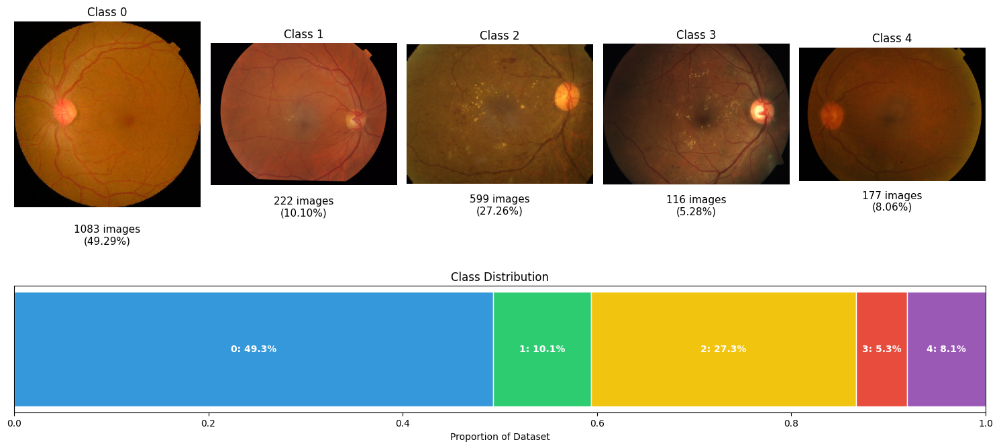

Example image path: /kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train/753b14c27c83.png
Does file exist? True


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from matplotlib.gridspec import GridSpec

# Create figure
fig = plt.figure(figsize=(15, 8))
gs = GridSpec(2, 5, height_ratios=[3, 1])

# Define class colors
colors = ['#3498db', '#2ecc71', '#f1c40f', '#e74c3c', '#9b59b6']

# For each class, display an example image and stats
for i, class_id in enumerate(sorted(class_counts.index)):
    # Select a random image from this class
    class_samples = train_df[train_df['diagnosis'] == class_id]
    if len(class_samples) > 0:
        random_sample = class_samples.sample(1).iloc[0]
        # Using id_code column and TRAIN_PATH variable
        img_filename = f"{random_sample['id_code']}.png"  # Adjust file extension if needed
        img_path = os.path.join(TRAIN_PATH, img_filename)

        # Read the image
        try:
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            else:
                print(f"Warning: Could not load image at {img_path}")
                # Create a placeholder if image cannot be loaded
                img = np.ones((100, 100, 3), dtype=np.uint8) * 200
                cv2.putText(img, f"Class {class_id}", (15, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Create a placeholder if there's an error
            img = np.ones((100, 100, 3), dtype=np.uint8) * 200
            cv2.putText(img, f"Class {class_id}", (15, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

    else:
        # Create a placeholder if no images for this class
        img = np.ones((100, 100, 3), dtype=np.uint8) * 200
        cv2.putText(img, f"No images", (15, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

    # Display the image
    ax = fig.add_subplot(gs[0, i])
    ax.imshow(img)
    ax.set_title(f"Class {class_id}", fontsize=12)
    ax.axis('off')

    # Add count information below the image
    count = class_counts.get(class_id, 0)
    percentage = count / train_df.shape[0] * 100
    ax.text(0.5, -0.15, f"{count} images\n({percentage:.2f}%)",
            horizontalalignment='center', verticalalignment='center',
            transform=ax.transAxes, fontsize=11)

# Create a horizontal bar chart for total distribution
ax_bar = fig.add_subplot(gs[1, :])

# Calculate positions for stacked bars
left = 0
for i, class_id in enumerate(sorted(class_counts.index)):
    count = class_counts.get(class_id, 0)
    width = count / train_df.shape[0]
    ax_bar.barh(0, width, left=left, color=colors[i % len(colors)], edgecolor='white')

    # Add text in the middle of each segment if wide enough
    if width > 0.05:  # Only add text if segment is wide enough
        ax_bar.text(left + width/2, 0, f"{class_id}: {width*100:.1f}%",
                   ha='center', va='center', color='white', fontweight='bold')

    left += width

ax_bar.set_xlim(0, 1)
ax_bar.set_yticks([])
ax_bar.set_title("Class Distribution", fontsize=12)
ax_bar.set_xlabel("Proportion of Dataset")

plt.tight_layout()
plt.show()

# Optional: Let's print the path of one example image to verify we're looking in the right place
if len(class_samples) > 0:
    print(f"Example image path: {img_path}")
    print(f"Does file exist? {os.path.exists(img_path)}")


Displaying random samples from each class...


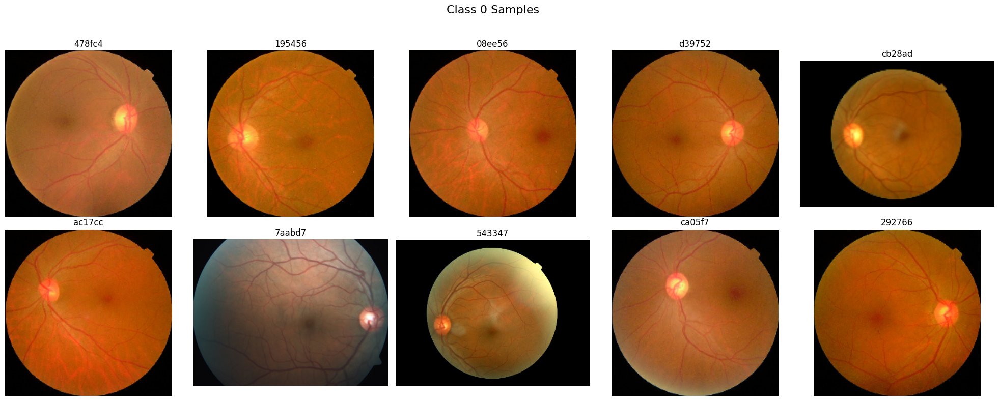

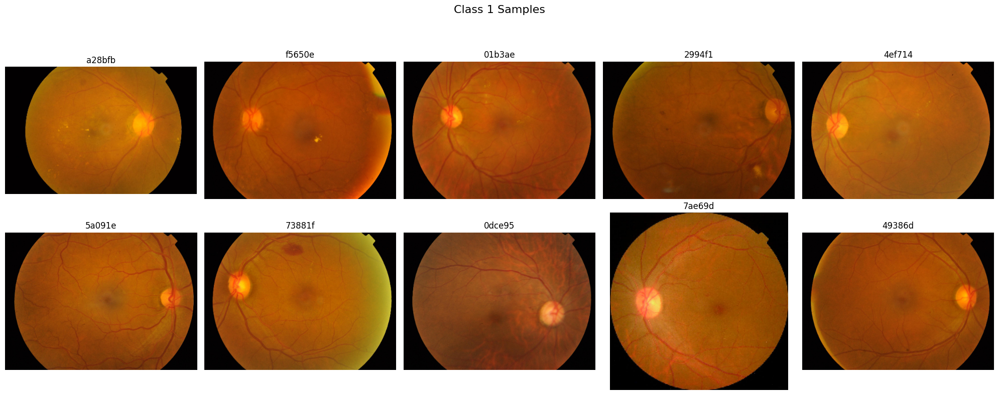

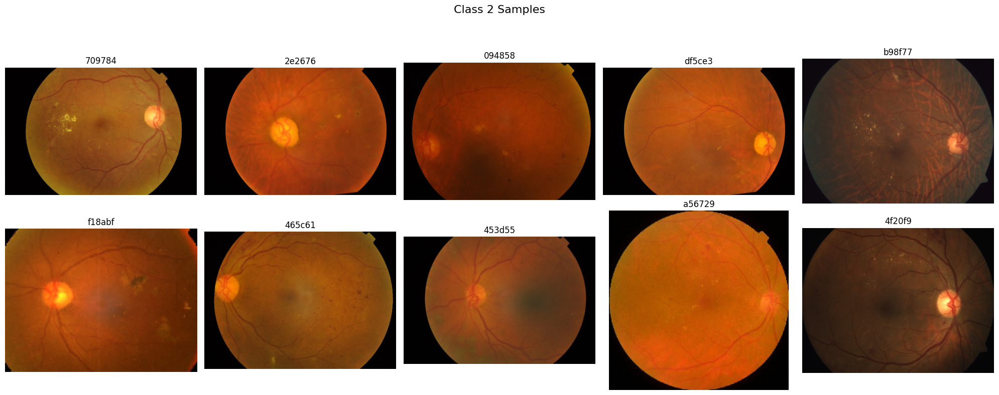

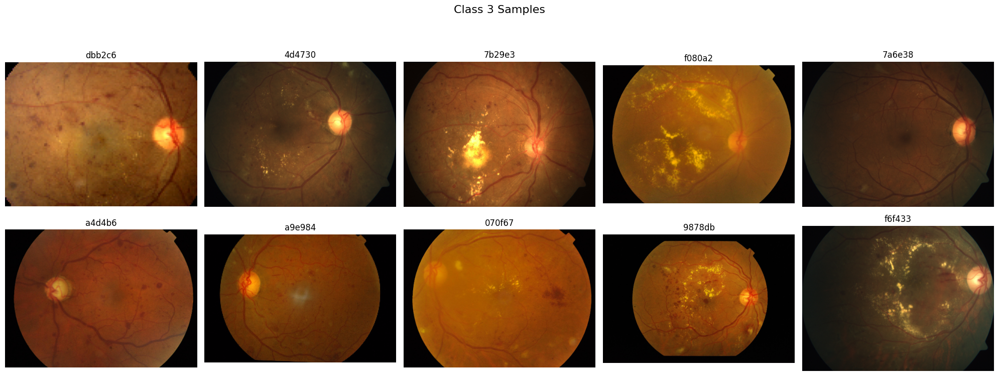

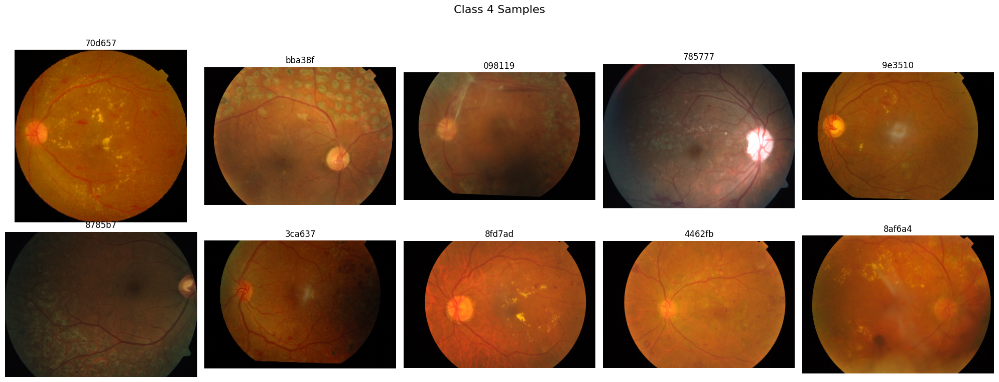

In [ ]:
from PIL import Image

# 4. Display Random Images from Each Class
print("\nDisplaying random samples from each class...")

# Sample 10 images from each class
for class_id in range(num_classes):
    class_images = train_df[train_df['diagnosis'] == class_id]['id_code'].tolist()
    samples = random.sample(class_images, min(10, len(class_images)))

    plt.figure(figsize=(20, 8))
    plt.suptitle(f'Class {class_id} Samples', fontsize=16)

    for i, img_id in enumerate(samples):
        img_path = os.path.join(TRAIN_PATH, f"{img_id}.png")
        img = Image.open(img_path)

        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{img_id[:6]}")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
import os
from PIL import Image, ImageFile # Import ImageFile to handle truncated images
import hashlib
import pandas as pd
from collections import defaultdict

# Allow Pillow to load truncated images (can be useful for partially corrupted files)
ImageFile.LOAD_TRUNCATED_IMAGES = True

def get_image_files(directory):
    """
    Helper function to get a list of image files in a given directory.
    Filters for common image extensions.
    """
    image_files = []
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        if os.path.isfile(filepath) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            image_files.append(filepath)
    return image_files

def analyze_image_dimensions(image_dir):
    """
    Analyzes the dimensions (width, height) of images in a given directory.
    Prints a summary of unique dimensions and their counts.
    """
    print(f"\n--- Analyzing Image Dimensions in: {image_dir} ---")
    dimensions_counts = defaultdict(int)
    total_images_processed = 0

    image_files = get_image_files(image_dir)
    if not image_files:
        print(f"No image files found in {image_dir}.")
        return

    for filepath in image_files:
        total_images_processed += 1
        try:
            with Image.open(filepath) as img:
                dimensions_counts[img.size] += 1 # Store (width, height)
        except Exception as e:
            # This catch is mostly for dimensions; actual corruption is handled by find_corrupted_images
            print(f"Warning: Could not read dimensions for {os.path.basename(filepath)}: {e}")

    print(f"Total image files processed: {total_images_processed}")
    if dimensions_counts:
        print("Unique dimensions found (Width x Height : Count):")
        # Sort by count for better readability
        sorted_dimensions = sorted(dimensions_counts.items(), key=lambda item: item[1], reverse=True)
        for dim, count in sorted_dimensions:
            print(f"  {dim[0]}x{dim[1]} : {count}")
    else:
        print("No valid image dimensions could be read.")


analyze_image_dimensions(TRAIN_PATH)
print("\n" + "="*50)
analyze_image_dimensions(TEST_PATH)


--- Analyzing Image Dimensions in: /kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train ---
Total image files processed: 2197
Unique dimensions found (Width x Height : Count):
  210x210 : 572
  483x347 : 380
  517x391 : 321
  643x427 : 247
  409x307 : 218
  163x122 : 174
  677x517 : 88
  300x200 : 53
  368x245 : 42
  857x569 : 31
  579x388 : 22
  128x96 : 21
  428x284 : 15
  295x223 : 9
  293x222 : 2
  94x71 : 2


--- Analyzing Image Dimensions in: /kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test ---
Total image files processed: 1465
Unique dimensions found (Width x Height : Count):
  210x210 : 402
  483x347 : 258
  517x391 : 212
  643x427 : 163
  409x307 : 133
  163x122 : 113
  677x517 : 53
  300x200 : 39
  128x96 : 21
  857x569 : 21
  368x245 : 19
  428x284 : 13
  579x388 : 12
  295x223 : 5
  429x352 : 1


In [ ]:
def find_corrupted_images(image_dir):
    """
    Identifies corrupted or unreadable images in a given directory.
    Uses Image.verify() to check file integrity.
    """
    print(f"\n--- Checking for Corrupted Images in: {image_dir} ---")
    corrupted_images = []
    total_files_checked = 0

    image_files = get_image_files(image_dir)
    if not image_files:
        print(f"No image files found in {image_dir}.")
        return []

    for filepath in image_files:
        total_files_checked += 1
        try:
            with Image.open(filepath) as img:
                # The .verify() method attempts to read the image data fully,
                # raising an exception if it encounters issues.
                img.verify()
        except Exception as e:
            corrupted_images.append((os.path.basename(filepath), str(e)))
        finally:
            # Important: Close the image file after verify to release resources
            # if img.verify() doesn't implicitly close it or if it errors out before closing.
            # However, 'with Image.open()' handles closing.
            pass

    if not corrupted_images:
        print(f"No corrupted images found among {total_files_checked} image files.")
    else:
        print(f"Found {len(corrupted_images)} corrupted images out of {total_files_checked} image files:")
        for img_name, error_msg in corrupted_images:
            print(f"  {img_name} - Error: {error_msg}")
    return corrupted_images


# --- Main Execution ---
if __name__ == "__main__":
    print("Starting EDA for Diabetic Retinopathy Datasets...")

    # Analyze Training Data
    corrupted_train_images = find_corrupted_images(TRAIN_PATH)

    print("\n" + "="*50)

    # Analyze Test Data
    corrupted_test_images = find_corrupted_images(TEST_PATH)

    print("\nEDA Complete!")
    print("\nSummary of findings:")
    print(f"  Corrupted training images: {len(corrupted_train_images)}")
    print(f"  Corrupted test images: {len(corrupted_test_images)}")

Starting EDA for Diabetic Retinopathy Datasets...

--- Checking for Corrupted Images in: /kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train ---
No corrupted images found among 2197 image files.


--- Checking for Corrupted Images in: /kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test ---
No corrupted images found among 1465 image files.

EDA Complete!

Summary of findings:
  Corrupted training images: 0
  Corrupted test images: 0


Showing enhancements for a single image: 3cab32dd6ef9, Label: 0


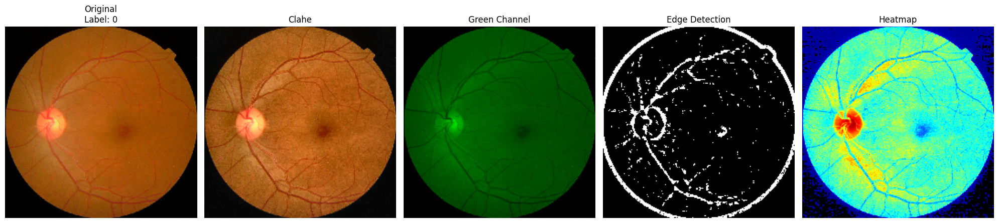

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import pandas as pd

# Paths
PROCESSED_TRAIN_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
TRAIN_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'

# Use available path
IMAGE_PATH = PROCESSED_TRAIN_PATH if os.path.exists(PROCESSED_TRAIN_PATH) else ORIGINAL_TRAIN_PATH

# Load CSV and build label dictionary
train_df = pd.read_csv(TRAIN_CSV)
label_dict = dict(zip(train_df['id_code'], train_df['diagnosis']))

# Function to apply various enhancements to retinal images - improved version
def enhance_retinal_image(img, method):
    """
    Apply different enhancement methods to retinal images to highlight features
    """
    # Ensure we're working with RGB images
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    elif img.shape[2] == 4:  # RGBA
        img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

    # Create a mask for non-black areas (retina region)
    mask = (img.sum(axis=2) > 0).astype(np.uint8) * 255

    if method == 'original':
        return img

    elif method == 'clahe':
        # Convert to LAB color space for CLAHE
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        # Apply CLAHE to L channel
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        lab[..., 0] = clahe.apply(lab[..., 0])
        # Convert back to RGB
        enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
        return enhanced

    elif method == 'green_channel':
        # Extract green channel (best for vessel visualization)
        green = img.copy()
        green[:, :, 0] = 0  # Remove red
        green[:, :, 2] = 0  # Remove blue
        return green

    elif method == 'edge_detection':
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply median blur to reduce noise while preserving edges
        blurred = cv2.medianBlur(gray, 5)
        # Apply adaptive thresholding to highlight vessels
        thresh = cv2.adaptiveThreshold(
            blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV, 11, 2)
        # Apply mask to keep only the retina region
        thresh = cv2.bitwise_and(thresh, thresh, mask=mask)
        # Convert back to RGB for visualization
        edges_rgb = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)
        return edges_rgb


    elif method == 'heatmap':
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply CLAHE for contrast enhancement
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        enhanced = clahe.apply(gray)
        # Apply colormap for heatmap visualization
        heatmap = cv2.applyColorMap(enhanced, cv2.COLORMAP_JET)
        # Convert from BGR to RGB
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        # Apply mask to keep only the retina region
        heatmap_masked = cv2.bitwise_and(heatmap, heatmap, mask=mask)
        return heatmap_masked

    # Default case
    return img

# Visualize one image with enhancements and save each output
def visualize_enhancements(image_path, label=None, save_output=False, save_dir='/kaggle/working/method_train'):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    methods = [
        'original', 'clahe', 'green_channel', 'edge_detection', 'heatmap'
    ]

    fig, axes = plt.subplots(1, 5, figsize=(20, 10))
    axes = axes.flatten()

    img_id = os.path.splitext(os.path.basename(image_path))[0]

    for i, method in enumerate(methods):
        enhanced = enhance_retinal_image(img, method)
        title = method.replace('_', ' ').title()
        if method == 'original':
            title += f"\nLabel: {label}"
        axes[i].imshow(enhanced)
        axes[i].set_title(title)
        axes[i].axis('off')

        # Save each enhanced image into method folder
        if save_output:
            method_save_path = os.path.join(save_dir, method)
            os.makedirs(method_save_path, exist_ok=True)
            out_img = cv2.cvtColor(enhanced, cv2.COLOR_RGB2BGR)
            out_path = os.path.join(method_save_path, f"{img_id}.png")
            cv2.imwrite(out_path, out_img)

    plt.tight_layout()
    plt.show()

# Process and save ALL images, not just samples
def visualize_all_enhancements(image_paths, save_output=True):
    for i, img_path in enumerate(tqdm(image_paths, desc="Processing Images")):
        img_id = os.path.splitext(os.path.basename(img_path))[0]
        label = label_dict.get(img_id, "Unknown")
        visualize_enhancements(img_path, label, save_output=save_output)

# Get image paths
image_paths = [os.path.join(IMAGE_PATH, filename)
               for filename in os.listdir(IMAGE_PATH)
               if filename.lower().endswith(('.png', '.jpg', '.jpeg'))]

if image_paths:
    random_image_path = random.choice(image_paths)
    img_id = os.path.splitext(os.path.basename(random_image_path))[0]
    label = label_dict.get(img_id, "Unknown")

    print(f"Showing enhancements for a single image: {img_id}, Label: {label}")
    visualize_enhancements(random_image_path, label=label, save_output=True)
else:
    print(f"No images found in {IMAGE_PATH}")

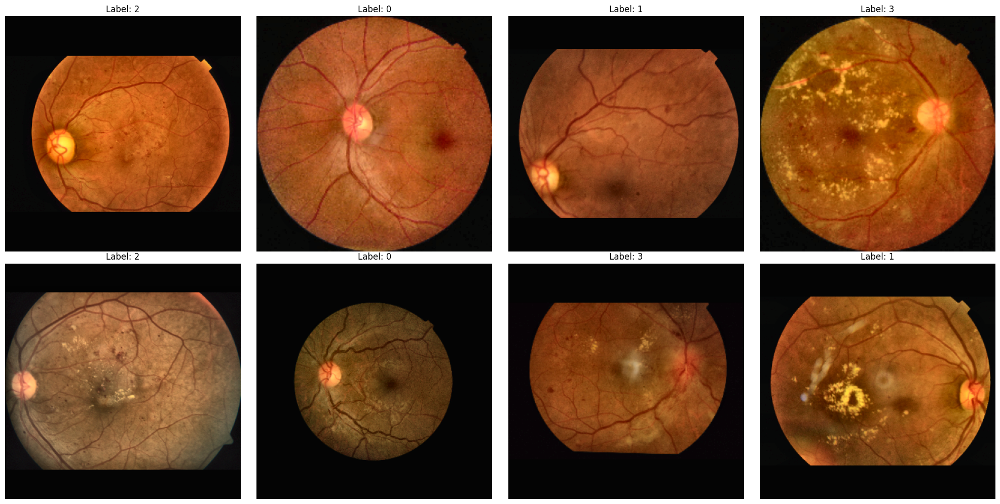

In [ ]:
import os
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Paths
PROCESSED_TRAIN_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
TRAIN_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'

# Load image paths and labels
image_paths = [os.path.join(PROCESSED_TRAIN_PATH, filename)
               for filename in os.listdir(PROCESSED_TRAIN_PATH)
               if filename.lower().endswith(('.png', '.jpg', '.jpeg'))]

train_df = pd.read_csv(TRAIN_CSV)
label_dict = dict(zip(train_df['id_code'], train_df['diagnosis']))

def clahe_enhance_with_resize(img, target_size=386):
    # Ensure RGB
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    elif img.shape[2] == 4:
        img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

    # --- Resize with aspect ratio preserved and padding ---
    h, w = img.shape[:2]
    scale = target_size / max(h, w)
    new_h, new_w = int(h * scale), int(w * scale)
    resized = cv2.resize(img, (new_w, new_h))

    top = (target_size - new_h) // 2
    bottom = target_size - new_h - top
    left = (target_size - new_w) // 2
    right = target_size - new_w - left

    padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                borderType=cv2.BORDER_CONSTANT, value=[0, 0, 0])

    # --- Apply CLAHE ---
    lab = cv2.cvtColor(padded, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab[..., 0] = clahe.apply(lab[..., 0])
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    return enhanced


# Visualize 8 random CLAHE-enhanced images
def visualize_8_random_clahe():
    selected = random.sample(image_paths, 8)

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()

    for i, img_path in enumerate(selected):
        img_id = os.path.splitext(os.path.basename(img_path))[0]
        label = label_dict.get(img_id, "Unknown")
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        clahe_img = clahe_enhance_with_resize(img)
        axes[i].imshow(clahe_img)
        axes[i].set_title(f"Label: {label}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Run
visualize_8_random_clahe()

# Model 5: Two-Stage ViT Model with Three-Headed Stage 2

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
from sklearn.utils.class_weight import compute_class_weight
import timm
import os
import joblib
import warnings

warnings.filterwarnings("ignore")

# --- Configuration ---
TRAIN_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'
TRAIN_DIR = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
TEST_DIR = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test'
SAMPLE_SUBMISSION_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/submission.csv'
OUTPUT_DIR = "output_results_v3_vit_focal_threehead" # Changed output directory to reflect changes

# Model and training parameters
IMG_SIZE = 384 # ViT standard input size
BATCH_SIZE = 16
N_EPOCHS_M1 = 15 # Binary classification is easier, may require fewer epochs
N_EPOCHS_M2 = 30
N_FOLDS = 5
# Switched to a Vision Transformer backbone
ENCODER_MODEL_NAME = 'vit_base_patch16_384'
# Adjusted Learning Rates for ViT and new pipeline
LR_M1_HEAD = 3e-4
LR_M1_BACKBONE = 3e-5
LR_M2_HEAD = 3e-4 # Using this for all three heads in Model 2
LR_M2_BACKBONE = 3e-5
REG_LOSS_WEIGHT = 0.1 # This weight will now only apply to the regression head loss in Model 1
ORD_LOSS_WEIGHT = 0.5 # New weight for ordinal loss in Model 2
REG_LOSS_WEIGHT_M2 = 0.5 # New weight for regression loss in Model 2
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create output directories
os.makedirs(OUTPUT_DIR, exist_ok=True)
MODEL_SAVE_DIR = os.path.join(OUTPUT_DIR, "saved_models")
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# --- Preprocessing Functions ---
def apply_clahe(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

def apply_unsharp_mask(image, sigma=1.0, strength=1.5):
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    return cv2.addWeighted(image, 1.0 + strength, blurred, -strength, 0)

# --- Dataset Class ---
class DRDataset(Dataset):
    def __init__(self, df_data, img_dir, transforms=None, is_test=False, clf_target_col=None, reg_target_col=None, ordinal_mode=False):
        self.df = df_data.reset_index(drop=True)
        self.img_dir = img_dir
        self.transforms = transforms
        self.is_test = is_test
        self.clf_target_col = clf_target_col
        self.reg_target_col = reg_target_col
        self.ordinal_mode = ordinal_mode

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_id = self.df.loc[idx, 'id_code']
        img_name = f"{img_id}.png"
        img_path = os.path.join(self.img_dir, img_name)
        image = cv2.imread(img_path)

        if image is None:
            print(f"FATAL: Image not found at {img_path}. Check data paths.")
            image = np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)
        else:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        image = apply_clahe(image)
        image = apply_unsharp_mask(image)

        if self.transforms:
            image = self.transforms(image=image)['image']

        if self.is_test:
            return image, img_id
        else:
            label_clf = self.df.loc[idx, self.clf_target_col]
            label_reg = self.df.loc[idx, self.reg_target_col]

            # For Model 2 (ordinal_mode=True), return all three targets
            if self.ordinal_mode:
                return image, (torch.tensor(label_clf, dtype=torch.long),
                               torch.tensor(label_reg, dtype=torch.float).unsqueeze(0),
                               torch.tensor(label_clf, dtype=torch.long)) # Use clf label also for ordinal target generation
            else: # For Model 1 (binary classification)
                return image, (torch.tensor(label_clf, dtype=torch.long),
                               torch.tensor(label_reg, dtype=torch.float).unsqueeze(0))

# --- Augmentations ---
def get_train_transforms(img_size):
    return A.Compose([
        A.Resize(img_size, img_size),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.GaussNoise(p=0.2),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

def get_valid_transforms(img_size):
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

# --- Model Architectures ---
class MultiTaskModel(nn.Module): # For Model 1 (Binary Classification)
    def __init__(self, encoder_name, num_classes, pretrained=True):
        super().__init__()
        self.encoder = timm.create_model(encoder_name, pretrained=pretrained)
        n_features = self.encoder.head.in_features
        self.encoder.head = nn.Identity() # Remove the original head

        self.classification_head = nn.Linear(n_features, num_classes)
        self.regression_head = nn.Linear(n_features, 1)

    def forward(self, x):
        features = self.encoder(x)
        clf_output = self.classification_head(features)
        reg_output = self.regression_head(features)
        return clf_output, reg_output

class ThreeHeadModel(nn.Module): # For Model 2 (4-Class Severity Grading)
    def __init__(self, encoder_name, num_classes, pretrained=True):
        super().__init__()
        self.encoder = timm.create_model(encoder_name, pretrained=pretrained, num_classes=0) # num_classes=0 for feature extraction

        # Determine encoder_output_shape dynamically
        # Create a dummy input with the correct image size
        dummy_input_size = (1, 3, IMG_SIZE, IMG_SIZE)
        dummy_input = torch.randn(dummy_input_size)

        with torch.no_grad(): # Ensure no gradients are computed during this dummy pass
            encoder_output = self.encoder(dummy_input)
        encoder_output_shape = encoder_output.shape[-1] # Assumes features are in the last dimension

        intermediate_features = 512
        self.shared_dense = nn.Sequential(
            nn.Linear(encoder_output_shape, intermediate_features),
            nn.BatchNorm1d(intermediate_features), # As per Fig 5 showing BatchNorm1D
            nn.ReLU()
        )
        self.classification_head = nn.Linear(intermediate_features, num_classes)
        self.regression_head = nn.Linear(intermediate_features, 1)
        self.ordinal_head = nn.Linear(intermediate_features, num_classes - 1) # N_CLASSES - 1 for ordinal output

    def forward(self, x):
        features = self.encoder(x)
        shared_out = self.shared_dense(features)
        clf_out = self.classification_head(shared_out)
        reg_out = self.regression_head(shared_out)
        ord_out = self.ordinal_head(shared_out)
        return clf_out, reg_out, ord_out

# --- Loss Functions ---
# Focal Loss Implementation
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        p = torch.softmax(inputs, dim=1)
        p_t = p.gather(1, targets.unsqueeze(1)).squeeze(1)
        log_p_t = torch.log(p_t.clamp(min=1e-8)) # Clamp to avoid log(0)
        focal_term = (1 - p_t) ** self.gamma

        if self.alpha is not None:
            alpha_t = self.alpha.gather(0, targets)
            loss = -alpha_t * focal_term * log_p_t
        else:
            loss = -focal_term * log_p_t

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else: # 'none'
            return loss

# Helper for ordinal targets
def get_ordinal_targets(labels, num_classes):
    ordinal_targets = torch.zeros(labels.size(0), num_classes - 1, device=labels.device)
    for i, label in enumerate(labels):
        if label > 0: # Labels are 0,1,2,3 for 4 classes, so if label is > 0, it means it's a DR grade
            ordinal_targets[i, :label.item()] = 1.0 # If label is 1, targets[i,0]=1. If label is 2, targets[i,0:2]=1 etc.
    return ordinal_targets

# --- Training and Validation ---
# Modified train_epoch_mtl to handle either 2 outputs (Model 1) or 3 outputs (Model 2)
def train_epoch_mtl(loader, model, optimizer, crit_clf, crit_reg, crit_ord, reg_weight, ord_weight, device, model_type="M1"):
    model.train()
    total_loss = 0
    for data, targets in loader:
        data = data.to(device)
        optimizer.zero_grad()

        if model_type == "M1": # For Binary Classification
            targets_clf, targets_reg = targets[0].to(device), targets[1].to(device)
            clf_out, reg_out = model(data)
            loss_clf = crit_clf(clf_out, targets_clf)
            loss_reg = crit_reg(reg_out, targets_reg)
            loss = loss_clf + reg_weight * loss_reg
        elif model_type == "M2": # For 4-Class Severity Grading with ThreeHeadModel
            targets_clf, targets_reg, targets_ord_raw = targets[0].to(device), targets[1].to(device), targets[2].to(device)
            clf_out, reg_out, ord_out = model(data)

            loss_clf = crit_clf(clf_out, targets_clf) # Focal Loss
            loss_reg = crit_reg(reg_out, targets_reg) # MSE Loss

            # Ordinal loss
            # For get_ordinal_targets, we pass the raw classification target (0,1,2,3)
            # and N_CLASSES for Model 2 (which is 4)
            ord_targets = get_ordinal_targets(targets_ord_raw, 4) # Hardcoding 4 for M2 classes
            loss_ord = crit_ord(ord_out, ord_targets) # BCEWithLogitsLoss

            loss = loss_clf + reg_weight * loss_reg + ord_weight * loss_ord
        else:
            raise ValueError("Invalid model_type. Must be 'M1' or 'M2'.")

        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

# Modified validate_epoch_mtl to handle either 2 outputs (Model 1) or 3 outputs (Model 2)
# And to always use the classification output for Kappa calculation.
def validate_epoch_mtl(loader, model, device, num_classes, model_type="M1"):
    model.eval()
    all_preds, all_targets = [], []
    with torch.no_grad():
        for data, targets in loader:
            data = data.to(device)
            if model_type == "M1":
                targets_clf = targets[0].to(device)
                clf_out, _ = model(data)
            elif model_type == "M2":
                targets_clf = targets[0].to(device)
                clf_out, _, _ = model(data)
            else:
                raise ValueError("Invalid model_type. Must be 'M1' or 'M2'.")

            predictions = torch.argmax(clf_out, dim=1)
            all_preds.extend(predictions.cpu().numpy())
            all_targets.extend(targets_clf.cpu().numpy()) # Use .cpu().numpy() for metrics

    # Corrected: Changed 'simple' to None for binary kappa calculation, and 'quadratic' for multi-class
    return cohen_kappa_score(all_targets, all_preds, weights='quadratic' if num_classes > 2 else None)

# --- Prediction with TTA ---
def predict_with_tta(model, images, device, model_type="M1"):
    model.eval()
    with torch.no_grad():
        if model_type == "M1":
            clf_out_orig, _ = model(images)
        elif model_type == "M2":
            clf_out_orig, _, _ = model(images) # Only need clf_out
        else:
            raise ValueError("Invalid model_type. Must be 'M1' or 'M2'.")

        probs_orig = torch.softmax(clf_out_orig, dim=1)

        images_hflip = torch.flip(images, dims=[3])
        if model_type == "M1":
            clf_out_hflip, _ = model(images_hflip)
        elif model_type == "M2":
            clf_out_hflip, _, _ = model(images_hflip) # Only need clf_out

        probs_hflip = torch.softmax(clf_out_hflip, dim=1)
        return (probs_orig + probs_hflip) / 2.0

# --- Main Script ---
def run_training():
    print(f"Using device: {DEVICE}")
    try:
        main_df = pd.read_csv(TRAIN_CSV)
        print(f"Successfully loaded {TRAIN_CSV} with {len(main_df)} records.")
    except FileNotFoundError:
        print(f"FATAL ERROR: Training CSV not found at {TRAIN_CSV}.")
        return

    # --- MODEL 1: Binary DR vs No DR ---
    print("\n" + "="*50 + "\nStage 1: Training Model 1 (DR vs. No DR)\n" + "="*50)
    main_df['model1_label'] = (main_df['diagnosis'] > 0).astype(int) # 0 for No DR, 1 for DR
    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

    for fold, (train_idx, val_idx) in enumerate(skf.split(main_df['id_code'], main_df['model1_label'])):
        print(f"\n--- Fold {fold+1}/{N_FOLDS} for Model 1 ---")
        model1 = MultiTaskModel(ENCODER_MODEL_NAME, num_classes=2).to(DEVICE)

        train_loader = DataLoader(DRDataset(main_df.iloc[train_idx], TRAIN_DIR, get_train_transforms(IMG_SIZE), clf_target_col='model1_label', reg_target_col='model1_label'), batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
        val_loader = DataLoader(DRDataset(main_df.iloc[val_idx], TRAIN_DIR, get_valid_transforms(IMG_SIZE), clf_target_col='model1_label', reg_target_col='model1_label'), batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

        # Optimizer for Model 1
        optimizer = optim.AdamW([
            {'params': model1.encoder.parameters(), 'lr': LR_M1_BACKBONE},
            {'params': model1.classification_head.parameters(), 'lr': LR_M1_HEAD},
            {'params': model1.regression_head.parameters(), 'lr': LR_M1_HEAD}
        ])
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=N_EPOCHS_M1)
        crit_clf_m1, crit_reg_m1 = nn.CrossEntropyLoss(), nn.MSELoss() # Original losses for Model 1

        best_kappa = -1.0
        for epoch in range(N_EPOCHS_M1):
            train_loss = train_epoch_mtl(train_loader, model1, optimizer, crit_clf_m1, crit_reg_m1, None, REG_LOSS_WEIGHT, 0, DEVICE, model_type="M1")
            val_kappa = validate_epoch_mtl(val_loader, model1, DEVICE, 2, model_type="M1")
            scheduler.step()
            print(f"Epoch {epoch+1}/{N_EPOCHS_M1} | Train Loss: {train_loss:.4f} | Val Kappa: {val_kappa:.4f}")
            if val_kappa > best_kappa:
                best_kappa = val_kappa
                torch.save(model1.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_model_1_fold_{fold}.pth"))
                print(f"Saved Model 1 for fold {fold+1} with Kappa: {best_kappa:.4f}")
        print(f"Best Kappa for Model 1, Fold {fold+1}: {best_kappa:.4f}")

    # --- MODEL 2: 4-Class Severity Grading ---
    print("\n" + "="*50 + "\nStage 2: Training Model 2 (Severity Grades 1-4)\n" + "="*50)
    dr_df = main_df[main_df['diagnosis'] > 0].copy()
    dr_df['model2_label'] = dr_df['diagnosis'] - 1 # Map 1,2,3,4 to 0,1,2,3 for 4 classes

    # Calculate class weights for Focal Loss for Model 2
    class_counts_m2 = dr_df['model2_label'].value_counts().sort_index()
    total_samples_m2 = len(dr_df)

    # Ensure all 4 classes (0, 1, 2, 3) are represented in class_counts_m2 for weight calculation
    # Fill missing classes with 0 count to avoid KeyError during reindexing
    all_classes_m2 = np.arange(4) # Classes 0, 1, 2, 3
    class_counts_m2 = class_counts_m2.reindex(all_classes_m2, fill_value=0)

    # Handle division by zero if a class has 0 samples (though unlikely with StratifiedKFold)
    # Add a small epsilon to avoid NaN in weights if a class count is 0
    weights_raw_m2 = total_samples_m2 / (4 * class_counts_m2.values + 1e-8)
    class_weights_focal_m2_tensor = torch.tensor(weights_raw_m2, dtype=torch.float).to(DEVICE)
    print(f"Class weights for Model 2 (Focal Loss): {class_weights_focal_m2_tensor}")

    crit_clf_m2 = FocalLoss(alpha=class_weights_focal_m2_tensor, gamma=2.0) # Focal Loss for Model 2
    crit_reg_m2 = nn.MSELoss() # MSE for regression head in Model 2
    crit_ord_m2 = nn.BCEWithLogitsLoss() # BCEWithLogitsLoss for ordinal head in Model 2

    skf_model2 = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
    for fold, (train_idx, val_idx) in enumerate(skf_model2.split(dr_df['id_code'], dr_df['model2_label'])):
        print(f"\n--- Fold {fold+1}/{N_FOLDS} for Model 2 ---")

        # Use ThreeHeadModel for Model 2
        model2 = ThreeHeadModel(ENCODER_MODEL_NAME, num_classes=4).to(DEVICE) # num_classes is 4 (0-3)

        train_loader = DataLoader(DRDataset(dr_df.iloc[train_idx], TRAIN_DIR, get_train_transforms(IMG_SIZE), clf_target_col='model2_label', reg_target_col='model2_label', ordinal_mode=True), batch_size=max(1, BATCH_SIZE//2), shuffle=True, num_workers=2)
        val_loader = DataLoader(DRDataset(dr_df.iloc[val_idx], TRAIN_DIR, get_valid_transforms(IMG_SIZE), clf_target_col='model2_label', reg_target_col='model2_label', ordinal_mode=True), batch_size=max(1, BATCH_SIZE//2), shuffle=False, num_workers=2)

        # Optimizer for Model 2, optimizing all three heads
        optimizer_m2 = optim.AdamW([
            {'params': model2.encoder.parameters(), 'lr': LR_M2_BACKBONE},
            {'params': model2.shared_dense.parameters(), 'lr': LR_M2_HEAD},
            {'params': model2.classification_head.parameters(), 'lr': LR_M2_HEAD},
            {'params': model2.regression_head.parameters(), 'lr': LR_M2_HEAD},
            {'params': model2.ordinal_head.parameters(), 'lr': LR_M2_HEAD}
        ])
        scheduler_m2 = optim.lr_scheduler.CosineAnnealingLR(optimizer_m2, T_max=N_EPOCHS_M2)

        best_kappa = -1.0
        for epoch in range(N_EPOCHS_M2):
            train_loss = train_epoch_mtl(train_loader, model2, optimizer_m2, crit_clf_m2, crit_reg_m2, crit_ord_m2, REG_LOSS_WEIGHT_M2, ORD_LOSS_WEIGHT, DEVICE, model_type="M2")
            val_kappa = validate_epoch_mtl(val_loader, model2, DEVICE, 4, model_type="M2") # Pass num_classes=4 for quadratic kappa
            scheduler_m2.step()
            print(f"Epoch {epoch+1}/{N_EPOCHS_M2} | Train Loss: {train_loss:.4f} | Val Kappa: {val_kappa:.4f}")
            if val_kappa > best_kappa:
                best_kappa = val_kappa
                torch.save(model2.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_model_2_fold_{fold}.pth"))
                print(f"Saved Model 2 for fold {fold+1} with Kappa: {best_kappa:.4f}")
        print(f"Best Kappa for Model 2, Fold {fold+1}: {best_kappa:.4f}")

    # --- Prediction on Test Set ---
    print("\n" + "="*50 + "\nStage 3: Generating Test Predictions\n" + "="*50)
    try:
        sub_df = pd.read_csv(SAMPLE_SUBMISSION_PATH)
    except FileNotFoundError:
        print(f"Warning: Sample submission file not found at {SAMPLE_SUBMISSION_PATH}.")
        sub_df = pd.DataFrame()
    if not sub_df.empty:
        test_dataset = DRDataset(sub_df, TEST_DIR, get_valid_transforms(IMG_SIZE), is_test=True)
        test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

        models1, models2 = [], []
        for fold in range(N_FOLDS):
            # Load Model 1 (MultiTaskModel)
            m1 = MultiTaskModel(ENCODER_MODEL_NAME, 2).to(DEVICE)
            m1_path = os.path.join(MODEL_SAVE_DIR, f"best_model_1_fold_{fold}.pth")
            if os.path.exists(m1_path):
                m1.load_state_dict(torch.load(m1_path)); models1.append(m1.eval())
            else:
                print(f"Warning: Model 1 for fold {fold} not found at {m1_path}. Skipping.")

            # Load Model 2 (ThreeHeadModel)
            m2 = ThreeHeadModel(ENCODER_MODEL_NAME, 4).to(DEVICE) # num_classes=4 for Model 2
            m2_path = os.path.join(MODEL_SAVE_DIR, f"best_model_2_fold_{fold}.pth")
            if os.path.exists(m2_path):
                m2.load_state_dict(torch.load(m2_path)); models2.append(m2.eval())
            else:
                print(f"Warning: Model 2 for fold {fold} not found at {m2_path}. Skipping.")


        if not models1 or not models2:
            print("ERROR: Not enough models loaded for prediction. Ensure training completed successfully.")
            return

        final_predictions = []
        with torch.no_grad():
            for images, img_ids in test_loader:
                images = images.to(DEVICE)

                # Stage 1: Get soft-voted binary predictions from Model 1
                all_fold_probs1 = torch.stack([predict_with_tta(m, images, DEVICE, model_type="M1") for m in models1], dim=1)
                avg_probs1 = torch.mean(all_fold_probs1, dim=1)
                preds1 = torch.argmax(avg_probs1, dim=1)

                final_batch_preds = torch.zeros_like(preds1) # Final predictions will be 0-4
                # Identify images with DR present (predicted as 1 by Model 1)
                dr_indices = (preds1 == 1).nonzero(as_tuple=True)[0]

                if len(dr_indices) > 0:
                    images_for_m2 = images[dr_indices]
                    # Stage 2: Get soft-voted 4-class predictions for DR images from Model 2
                    all_fold_probs2 = torch.stack([predict_with_tta(m, images_for_m2, DEVICE, model_type="M2") for m in models2], dim=1)
                    avg_probs2 = torch.mean(all_fold_probs2, dim=1)
                    preds2 = torch.argmax(avg_probs2, dim=1)

                    # Map predictions back to original labels (0,1,2,3 -> 1,2,3,4)
                    for i, original_idx in enumerate(dr_indices):
                        final_batch_preds[original_idx] = preds2[i] + 1 # Add 1 to get original diagnosis labels (1-4)

                final_predictions.extend(final_batch_preds.cpu().numpy())

        sub_df['diagnosis'] = final_predictions
        sub_df.to_csv(os.path.join(OUTPUT_DIR, 'submission.csv'), index=False)
        print(f"Submission file saved to: {os.path.join(OUTPUT_DIR, 'submission.csv')}")

if __name__ == '__main__':
    run_training()

Using device: cuda
Successfully loaded /kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv with 2197 records.

Stage 1: Training Model 1 (DR vs. No DR)

--- Fold 1/5 for Model 1 ---


model.safetensors:   0%|          | 0.00/347M [00:00<?, ?B/s]

Epoch 1/15 | Train Loss: 0.3126 | Val Kappa: 0.9181
Saved Model 1 for fold 1 with Kappa: 0.9181
Epoch 2/15 | Train Loss: 0.1384 | Val Kappa: 0.9364
Saved Model 1 for fold 1 with Kappa: 0.9364
Epoch 3/15 | Train Loss: 0.1120 | Val Kappa: 0.9047
Epoch 4/15 | Train Loss: 0.1111 | Val Kappa: 0.9409
Saved Model 1 for fold 1 with Kappa: 0.9409
Epoch 5/15 | Train Loss: 0.0942 | Val Kappa: 0.9636
Saved Model 1 for fold 1 with Kappa: 0.9636
Epoch 6/15 | Train Loss: 0.0846 | Val Kappa: 0.9636
Saved Model 1 for fold 1 with Kappa: 0.9636
Epoch 7/15 | Train Loss: 0.0633 | Val Kappa: 0.9092
Epoch 8/15 | Train Loss: 0.0846 | Val Kappa: 0.9636
Epoch 9/15 | Train Loss: 0.0490 | Val Kappa: 0.9500
Epoch 10/15 | Train Loss: 0.0495 | Val Kappa: 0.9500
Epoch 11/15 | Train Loss: 0.0350 | Val Kappa: 0.9545
Epoch 12/15 | Train Loss: 0.0419 | Val Kappa: 0.9545
Epoch 13/15 | Train Loss: 0.0334 | Val Kappa: 0.9545
Epoch 14/15 | Train Loss: 0.0219 | Val Kappa: 0.9545
Epoch 15/15 | Train Loss: 0.0305 | Val Kappa: 0

# Model 4: Two-Stage ViT Model:

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
from sklearn.utils.class_weight import compute_class_weight
import timm
import os
import joblib
import warnings

warnings.filterwarnings("ignore")

# --- Configuration ---
TRAIN_CSV = '/content/kaggle_retina/train.csv'
TRAIN_DIR = '/content/kaggle_retina/train'
TEST_DIR = '/content/kaggle_retina/test'
SAMPLE_SUBMISSION_PATH = '/content/kaggle_retina/submission.csv'
OUTPUT_DIR = "output_results_v3_vit"

# Model and training parameters
IMG_SIZE = 384 # ViT standard input size
BATCH_SIZE = 16
N_EPOCHS_M1 = 10 # Binary classification is easier, may require fewer epochs
N_EPOCHS_M2 = 25
N_FOLDS = 5
# Switched to a Vision Transformer backbone
ENCODER_MODEL_NAME = 'vit_base_patch16_384'
# Adjusted Learning Rates for ViT and new pipeline
LR_M1_HEAD = 3e-4
LR_M1_BACKBONE = 3e-5
LR_M2_HEAD = 3e-4
LR_M2_BACKBONE = 3e-5
REG_LOSS_WEIGHT = 0.1
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create output directories
os.makedirs(OUTPUT_DIR, exist_ok=True)
MODEL_SAVE_DIR = os.path.join(OUTPUT_DIR, "saved_models")
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# --- Preprocessing Functions ---
def apply_clahe(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

def apply_unsharp_mask(image, sigma=1.0, strength=1.5):
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    return cv2.addWeighted(image, 1.0 + strength, blurred, -strength, 0)

# --- Dataset Class ---
class DRDataset(Dataset):
    def __init__(self, df_data, img_dir, transforms=None, is_test=False, clf_target_col=None, reg_target_col=None):
        self.df = df_data.reset_index(drop=True)
        self.img_dir = img_dir
        self.transforms = transforms
        self.is_test = is_test
        self.clf_target_col = clf_target_col
        self.reg_target_col = reg_target_col

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_id = self.df.loc[idx, 'id_code']
        img_name = f"{img_id}.png"
        img_path = os.path.join(self.img_dir, img_name)
        image = cv2.imread(img_path)

        if image is None:
            print(f"FATAL: Image not found at {img_path}. Check data paths.")
            image = np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)
        else:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        image = apply_clahe(image)
        image = apply_unsharp_mask(image)

        if self.transforms:
            image = self.transforms(image=image)['image']

        if self.is_test:
            return image, img_id
        else:
            label_clf = self.df.loc[idx, self.clf_target_col]
            label_reg = self.df.loc[idx, self.reg_target_col]
            return image, (torch.tensor(label_clf, dtype=torch.long), torch.tensor(label_reg, dtype=torch.float).unsqueeze(0))

# --- Augmentations ---
def get_train_transforms(img_size):
    return A.Compose([
        A.Resize(img_size, img_size),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.GaussNoise(p=0.2),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

def get_valid_transforms(img_size):
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

# --- Model Architecture ---
class MultiTaskModel(nn.Module):
    def __init__(self, encoder_name, num_classes, pretrained=True):
        super().__init__()
        # For ViT, the classifier is often named 'head'
        self.encoder = timm.create_model(encoder_name, pretrained=pretrained)
        n_features = self.encoder.head.in_features
        self.encoder.head = nn.Identity() # Remove the original head

        self.classification_head = nn.Linear(n_features, num_classes)
        self.regression_head = nn.Linear(n_features, 1)

    def forward(self, x):
        features = self.encoder(x)
        clf_output = self.classification_head(features)
        reg_output = self.regression_head(features)
        return clf_output, reg_output

# --- Training and Validation ---
def train_epoch_mtl(loader, model, optimizer, crit_clf, crit_reg, reg_weight, device):
    model.train()
    total_loss = 0
    for data, (targets_clf, targets_reg) in loader:
        data, targets_clf, targets_reg = data.to(device), targets_clf.to(device), targets_reg.to(device)
        optimizer.zero_grad()
        clf_out, reg_out = model(data)
        loss_clf = crit_clf(clf_out, targets_clf)
        loss_reg = crit_reg(reg_out, targets_reg)
        loss = loss_clf + reg_weight * loss_reg
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def validate_epoch_mtl(loader, model, device, num_classes):
    model.eval()
    all_preds, all_targets = [], []
    with torch.no_grad():
        for data, (targets_clf, _) in loader:
            data = data.to(device)
            clf_out, _ = model(data)
            predictions = torch.argmax(clf_out, dim=1)
            all_preds.extend(predictions.cpu().numpy())
            all_targets.extend(targets_clf.numpy())
    # Corrected: Changed 'simple' to None for binary kappa calculation
    return cohen_kappa_score(all_targets, all_preds, weights='quadratic' if num_classes > 2 else None)

# --- Prediction with TTA ---
def predict_with_tta(model, images, device):
    model.eval()
    with torch.no_grad():
        clf_out_orig, _ = model(images)
        probs_orig = torch.softmax(clf_out_orig, dim=1)
        images_hflip = torch.flip(images, dims=[3])
        clf_out_hflip, _ = model(images_hflip)
        probs_hflip = torch.softmax(clf_out_hflip, dim=1)
        return (probs_orig + probs_hflip) / 2.0

# --- Main Script ---
def run_training():
    print(f"Using device: {DEVICE}")
    try:
        main_df = pd.read_csv(TRAIN_CSV)
        print(f"Successfully loaded {TRAIN_CSV} with {len(main_df)} records.")
    except FileNotFoundError:
        print(f"FATAL ERROR: Training CSV not found at {TRAIN_CSV}.")
        return

    # --- MODEL 1: Binary DR vs No DR ---
    print("\n" + "="*50 + "\nStage 1: Training Model 1 (DR vs. No DR)\n" + "="*50)
    main_df['model1_label'] = (main_df['diagnosis'] > 0).astype(int) # 0 for No DR, 1 for DR
    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

    for fold, (train_idx, val_idx) in enumerate(skf.split(main_df['id_code'], main_df['model1_label'])):
        print(f"\n--- Fold {fold+1}/{N_FOLDS} for Model 1 ---")
        model1 = MultiTaskModel(ENCODER_MODEL_NAME, num_classes=2).to(DEVICE)
        train_loader = DataLoader(DRDataset(main_df.iloc[train_idx], TRAIN_DIR, get_train_transforms(IMG_SIZE), clf_target_col='model1_label', reg_target_col='model1_label'), batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
        val_loader = DataLoader(DRDataset(main_df.iloc[val_idx], TRAIN_DIR, get_valid_transforms(IMG_SIZE), clf_target_col='model1_label', reg_target_col='model1_label'), batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        optimizer = optim.AdamW([{'params': model1.encoder.parameters(), 'lr': LR_M1_BACKBONE}, {'params': model1.classification_head.parameters(), 'lr': LR_M1_HEAD}, {'params': model1.regression_head.parameters(), 'lr': LR_M1_HEAD}])
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=N_EPOCHS_M1)
        crit_clf, crit_reg = nn.CrossEntropyLoss(), nn.MSELoss()
        best_kappa = -1.0
        for epoch in range(N_EPOCHS_M1):
            train_loss = train_epoch_mtl(train_loader, model1, optimizer, crit_clf, crit_reg, REG_LOSS_WEIGHT, DEVICE)
            val_kappa = validate_epoch_mtl(val_loader, model1, DEVICE, 2)
            scheduler.step()
            print(f"Epoch {epoch+1}/{N_EPOCHS_M1} | Train Loss: {train_loss:.4f} | Val Kappa: {val_kappa:.4f}")
            if val_kappa > best_kappa:
                best_kappa = val_kappa
                torch.save(model1.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_model_1_fold_{fold}.pth"))
                print(f"Saved Model 1 for fold {fold+1} with Kappa: {best_kappa:.4f}")
        print(f"Best Kappa for Model 1, Fold {fold+1}: {best_kappa:.4f}")

    # --- MODEL 2: 4-Class Severity Grading ---
    print("\n" + "="*50 + "\nStage 2: Training Model 2 (Severity Grades 1-4)\n" + "="*50)
    dr_df = main_df[main_df['diagnosis'] > 0].copy()
    dr_df['model2_label'] = dr_df['diagnosis'] - 1 # Map 1,2,3,4 to 0,1,2,3
    class_weights = torch.tensor(compute_class_weight('balanced', classes=np.unique(dr_df['model2_label']), y=dr_df['model2_label']), dtype=torch.float).to(DEVICE)
    print(f"Class weights for Model 2: {class_weights}")
    skf_model2 = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
    for fold, (train_idx, val_idx) in enumerate(skf_model2.split(dr_df['id_code'], dr_df['model2_label'])):
        print(f"\n--- Fold {fold+1}/{N_FOLDS} for Model 2 ---")
        model2 = MultiTaskModel(ENCODER_MODEL_NAME, num_classes=4).to(DEVICE)
        train_loader = DataLoader(DRDataset(dr_df.iloc[train_idx], TRAIN_DIR, get_train_transforms(IMG_SIZE), clf_target_col='model2_label', reg_target_col='model2_label'), batch_size=max(1, BATCH_SIZE//2), shuffle=True, num_workers=2)
        val_loader = DataLoader(DRDataset(dr_df.iloc[val_idx], TRAIN_DIR, get_valid_transforms(IMG_SIZE), clf_target_col='model2_label', reg_target_col='model2_label'), batch_size=max(1, BATCH_SIZE//2), shuffle=False, num_workers=2)
        optimizer = optim.AdamW([{'params': model2.encoder.parameters(), 'lr': LR_M2_BACKBONE}, {'params': model2.classification_head.parameters(), 'lr': LR_M2_HEAD}, {'params': model2.regression_head.parameters(), 'lr': LR_M2_HEAD}])
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=N_EPOCHS_M2)
        crit_clf, crit_reg = nn.CrossEntropyLoss(weight=class_weights), nn.MSELoss()
        best_kappa = -1.0
        for epoch in range(N_EPOCHS_M2):
            train_loss = train_epoch_mtl(train_loader, model2, optimizer, crit_clf, crit_reg, REG_LOSS_WEIGHT, DEVICE)
            val_kappa = validate_epoch_mtl(val_loader, model2, DEVICE, 4)
            scheduler.step()
            print(f"Epoch {epoch+1}/{N_EPOCHS_M2} | Train Loss: {train_loss:.4f} | Val Kappa: {val_kappa:.4f}")
            if val_kappa > best_kappa:
                best_kappa = val_kappa
                torch.save(model2.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_model_2_fold_{fold}.pth"))
                print(f"Saved Model 2 for fold {fold+1} with Kappa: {best_kappa:.4f}")
        print(f"Best Kappa for Model 2, Fold {fold+1}: {best_kappa:.4f}")

    # --- Prediction on Test Set ---
    print("\n" + "="*50 + "\nStage 3: Generating Test Predictions\n" + "="*50)
    try:
        sub_df = pd.read_csv(SAMPLE_SUBMISSION_PATH)
    except FileNotFoundError:
        print(f"Warning: Sample submission file not found at {SAMPLE_SUBMISSION_PATH}.")
        sub_df = pd.DataFrame()
    if not sub_df.empty:
        test_dataset = DRDataset(sub_df, TEST_DIR, get_valid_transforms(IMG_SIZE), is_test=True)
        test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
        models1, models2 = [], []
        for fold in range(N_FOLDS):
            m1 = MultiTaskModel(ENCODER_MODEL_NAME, 2).to(DEVICE); m1.load_state_dict(torch.load(os.path.join(MODEL_SAVE_DIR, f"best_model_1_fold_{fold}.pth"))); models1.append(m1.eval())
            m2 = MultiTaskModel(ENCODER_MODEL_NAME, 4).to(DEVICE); m2.load_state_dict(torch.load(os.path.join(MODEL_SAVE_DIR, f"best_model_2_fold_{fold}.pth"))); models2.append(m2.eval())

        final_predictions = []
        with torch.no_grad():
            for images, img_ids in test_loader:
                images = images.to(DEVICE)
                # Stage 1: Get soft-voted binary predictions
                all_fold_probs1 = torch.stack([predict_with_tta(m, images, DEVICE) for m in models1], dim=1)
                avg_probs1 = torch.mean(all_fold_probs1, dim=1)
                preds1 = torch.argmax(avg_probs1, dim=1)

                final_batch_preds = torch.zeros_like(preds1) # Final predictions will be 0-4
                # Identify images with DR present
                dr_indices = (preds1 == 1).nonzero(as_tuple=True)[0]
                if len(dr_indices) > 0:
                    images_for_m2 = images[dr_indices]
                    # Stage 2: Get soft-voted 4-class predictions for DR images
                    all_fold_probs2 = torch.stack([predict_with_tta(m, images_for_m2, DEVICE) for m in models2], dim=1)
                    avg_probs2 = torch.mean(all_fold_probs2, dim=1)
                    preds2 = torch.argmax(avg_probs2, dim=1)
                    # Map predictions back to original labels (0,1,2,3 -> 1,2,3,4)
                    for i, original_idx in enumerate(dr_indices):
                        final_batch_preds[original_idx] = preds2[i] + 1

                final_predictions.extend(final_batch_preds.cpu().numpy())

        sub_df['diagnosis'] = final_predictions
        sub_df.to_csv(os.path.join(OUTPUT_DIR, 'submission.csv'), index=False)
        print(f"Submission file saved to: {os.path.join(OUTPUT_DIR, 'submission.csv')}")

if __name__ == '__main__':
    run_training()

## Model 4 Outputs:

<details>
<summary><strong>📊 Click to expand training output logs</strong></summary>

```
Using device: cuda
Successfully loaded /content/kaggle_retina/train.csv with 2197 records.

==================================================
Stage 1: Training Model 1 (DR vs. No DR)
==================================================

--- Fold 1/5 for Model 1 ---
model.safetensors: 100%
 347M/347M [00:00<00:00, 426MB/s]
Epoch 1/10 | Train Loss: 0.4105 | Val Kappa: 0.9682
Saved Model 1 for fold 1 with Kappa: 0.9682
Epoch 2/10 | Train Loss: 0.1398 | Val Kappa: 0.9727
Saved Model 1 for fold 1 with Kappa: 0.9727
Epoch 3/10 | Train Loss: 0.1108 | Val Kappa: 0.9682
Epoch 4/10 | Train Loss: 0.0786 | Val Kappa: 0.9591
Epoch 5/10 | Train Loss: 0.0813 | Val Kappa: 0.9773
Saved Model 1 for fold 1 with Kappa: 0.9773
Epoch 6/10 | Train Loss: 0.0578 | Val Kappa: 0.9409
Epoch 7/10 | Train Loss: 0.0490 | Val Kappa: 0.9682
Epoch 8/10 | Train Loss: 0.0485 | Val Kappa: 0.9500
Epoch 9/10 | Train Loss: 0.0393 | Val Kappa: 0.9636
Epoch 10/10 | Train Loss: 0.0307 | Val Kappa: 0.9636
Best Kappa for Model 1, Fold 1: 0.9773

--- Fold 2/5 for Model 1 ---
Epoch 1/10 | Train Loss: 0.3595 | Val Kappa: 0.9636
Saved Model 1 for fold 2 with Kappa: 0.9636
Epoch 2/10 | Train Loss: 0.1150 | Val Kappa: 0.9727
Saved Model 1 for fold 2 with Kappa: 0.9727
Epoch 3/10 | Train Loss: 0.1237 | Val Kappa: 0.9727
Saved Model 1 for fold 2 with Kappa: 0.9727
Epoch 4/10 | Train Loss: 0.0940 | Val Kappa: 0.9773
Saved Model 1 for fold 2 with Kappa: 0.9773
Epoch 5/10 | Train Loss: 0.0758 | Val Kappa: 0.9727
Epoch 6/10 | Train Loss: 0.0750 | Val Kappa: 0.9727
Epoch 7/10 | Train Loss: 0.0497 | Val Kappa: 0.9682
Epoch 8/10 | Train Loss: 0.0481 | Val Kappa: 0.9682
Epoch 9/10 | Train Loss: 0.0427 | Val Kappa: 0.9773
Epoch 10/10 | Train Loss: 0.0361 | Val Kappa: 0.9773
Best Kappa for Model 1, Fold 2: 0.9773

--- Fold 3/5 for Model 1 ---
Epoch 1/10 | Train Loss: 0.4514 | Val Kappa: 0.9544
Saved Model 1 for fold 3 with Kappa: 0.9544
Epoch 2/10 | Train Loss: 0.1207 | Val Kappa: 0.9407
Epoch 3/10 | Train Loss: 0.1039 | Val Kappa: 0.9635
Saved Model 1 for fold 3 with Kappa: 0.9635
Epoch 4/10 | Train Loss: 0.0972 | Val Kappa: 0.9635
Saved Model 1 for fold 3 with Kappa: 0.9635
Epoch 5/10 | Train Loss: 0.0744 | Val Kappa: 0.9772
Saved Model 1 for fold 3 with Kappa: 0.9772
Epoch 6/10 | Train Loss: 0.0666 | Val Kappa: 0.9499
Epoch 7/10 | Train Loss: 0.0499 | Val Kappa: 0.9408
Epoch 8/10 | Train Loss: 0.0580 | Val Kappa: 0.9681
Epoch 9/10 | Train Loss: 0.0472 | Val Kappa: 0.9681
Epoch 10/10 | Train Loss: 0.0425 | Val Kappa: 0.9727
Best Kappa for Model 1, Fold 3: 0.9772

--- Fold 4/5 for Model 1 ---
Epoch 1/10 | Train Loss: 0.3385 | Val Kappa: 0.9225
Saved Model 1 for fold 4 with Kappa: 0.9225
Epoch 2/10 | Train Loss: 0.1194 | Val Kappa: 0.9408
Saved Model 1 for fold 4 with Kappa: 0.9408
Epoch 3/10 | Train Loss: 0.1157 | Val Kappa: 0.9317
Epoch 4/10 | Train Loss: 0.1294 | Val Kappa: 0.9225
Epoch 5/10 | Train Loss: 0.0936 | Val Kappa: 0.9317
Epoch 6/10 | Train Loss: 0.0715 | Val Kappa: 0.9453
Saved Model 1 for fold 4 with Kappa: 0.9453
Epoch 7/10 | Train Loss: 0.0539 | Val Kappa: 0.9499
Saved Model 1 for fold 4 with Kappa: 0.9499
Epoch 8/10 | Train Loss: 0.0626 | Val Kappa: 0.9362
Epoch 9/10 | Train Loss: 0.0530 | Val Kappa: 0.9499
Epoch 10/10 | Train Loss: 0.0414 | Val Kappa: 0.9453
Best Kappa for Model 1, Fold 4: 0.9499

--- Fold 5/5 for Model 1 ---
Epoch 1/10 | Train Loss: 0.3145 | Val Kappa: 0.9635
Saved Model 1 for fold 5 with Kappa: 0.9635
Epoch 2/10 | Train Loss: 0.1202 | Val Kappa: 0.9727
Saved Model 1 for fold 5 with Kappa: 0.9727
Epoch 3/10 | Train Loss: 0.1300 | Val Kappa: 0.9499
Epoch 4/10 | Train Loss: 0.1041 | Val Kappa: 0.9499
Epoch 5/10 | Train Loss: 0.0879 | Val Kappa: 0.9636
Epoch 6/10 | Train Loss: 0.0640 | Val Kappa: 0.9772
Saved Model 1 for fold 5 with Kappa: 0.9772
Epoch 7/10 | Train Loss: 0.0589 | Val Kappa: 0.9772
Epoch 8/10 | Train Loss: 0.0590 | Val Kappa: 0.9681
Epoch 9/10 | Train Loss: 0.0367 | Val Kappa: 0.9727
Epoch 10/10 | Train Loss: 0.0394 | Val Kappa: 0.9727
Best Kappa for Model 1, Fold 5: 0.9772

==================================================
Stage 2: Training Model 2 (Severity Grades 1-4)
==================================================
Class weights for Model 2: tensor([1.2545, 0.4649, 2.4009, 1.5734], device='cuda:0')

--- Fold 1/5 for Model 2 ---
Epoch 1/25 | Train Loss: 1.8930 | Val Kappa: 0.1955
Saved Model 2 for fold 1 with Kappa: 0.1955
Epoch 2/25 | Train Loss: 1.4127 | Val Kappa: 0.4903
Saved Model 2 for fold 1 with Kappa: 0.4903
Epoch 3/25 | Train Loss: 1.2446 | Val Kappa: 0.5074
Saved Model 2 for fold 1 with Kappa: 0.5074
Epoch 4/25 | Train Loss: 1.1567 | Val Kappa: 0.5621
Saved Model 2 for fold 1 with Kappa: 0.5621
Epoch 5/25 | Train Loss: 1.1311 | Val Kappa: 0.2961
Epoch 6/25 | Train Loss: 1.0791 | Val Kappa: 0.4622
Epoch 7/25 | Train Loss: 0.8951 | Val Kappa: 0.5230
Epoch 8/25 | Train Loss: 0.8498 | Val Kappa: 0.6606
Saved Model 2 for fold 1 with Kappa: 0.6606
Epoch 9/25 | Train Loss: 0.7811 | Val Kappa: 0.5482
Epoch 10/25 | Train Loss: 0.7539 | Val Kappa: 0.6351
Epoch 11/25 | Train Loss: 0.6300 | Val Kappa: 0.6710
Saved Model 2 for fold 1 with Kappa: 0.6710
Epoch 12/25 | Train Loss: 0.6670 | Val Kappa: 0.6383
Epoch 13/25 | Train Loss: 0.5644 | Val Kappa: 0.5733
Epoch 14/25 | Train Loss: 0.4740 | Val Kappa: 0.6111
Epoch 15/25 | Train Loss: 0.4010 | Val Kappa: 0.6692
Epoch 16/25 | Train Loss: 0.4374 | Val Kappa: 0.6185
Epoch 17/25 | Train Loss: 0.3411 | Val Kappa: 0.6443
Epoch 18/25 | Train Loss: 0.3277 | Val Kappa: 0.6034
Epoch 19/25 | Train Loss: 0.3226 | Val Kappa: 0.6420
Epoch 20/25 | Train Loss: 0.2856 | Val Kappa: 0.6355
Epoch 21/25 | Train Loss: 0.2380 | Val Kappa: 0.6533
Epoch 22/25 | Train Loss: 0.2279 | Val Kappa: 0.6651
Epoch 23/25 | Train Loss: 0.2583 | Val Kappa: 0.6748
Saved Model 2 for fold 1 with Kappa: 0.6748
Epoch 24/25 | Train Loss: 0.2295 | Val Kappa: 0.6647
Epoch 25/25 | Train Loss: 0.2206 | Val Kappa: 0.6647
Best Kappa for Model 2, Fold 1: 0.6748

--- Fold 2/5 for Model 2 ---
Epoch 1/25 | Train Loss: 1.8625 | Val Kappa: 0.2337
Saved Model 2 for fold 2 with Kappa: 0.2337
Epoch 2/25 | Train Loss: 1.4028 | Val Kappa: 0.3124
Saved Model 2 for fold 2 with Kappa: 0.3124
Epoch 3/25 | Train Loss: 1.2565 | Val Kappa: 0.5519
Saved Model 2 for fold 2 with Kappa: 0.5519
Epoch 4/25 | Train Loss: 1.2070 | Val Kappa: 0.5183
Epoch 5/25 | Train Loss: 1.1443 | Val Kappa: 0.6063
Saved Model 2 for fold 2 with Kappa: 0.6063
Epoch 6/25 | Train Loss: 1.0319 | Val Kappa: 0.5662
Epoch 7/25 | Train Loss: 0.9182 | Val Kappa: 0.6646
Saved Model 2 for fold 2 with Kappa: 0.6646
Epoch 8/25 | Train Loss: 0.8174 | Val Kappa: 0.5840
Epoch 9/25 | Train Loss: 0.7780 | Val Kappa: 0.6388
Epoch 10/25 | Train Loss: 0.6144 | Val Kappa: 0.6147
Epoch 11/25 | Train Loss: 0.6265 | Val Kappa: 0.6292
Epoch 12/25 | Train Loss: 0.5150 | Val Kappa: 0.6214
Epoch 13/25 | Train Loss: 0.5080 | Val Kappa: 0.5920
Epoch 14/25 | Train Loss: 0.4756 | Val Kappa: 0.5158
Epoch 15/25 | Train Loss: 0.3848 | Val Kappa: 0.6143
Epoch 16/25 | Train Loss: 0.3350 | Val Kappa: 0.5818
Epoch 17/25 | Train Loss: 0.3176 | Val Kappa: 0.6519
Epoch 18/25 | Train Loss: 0.2656 | Val Kappa: 0.6710
Saved Model 2 for fold 2 with Kappa: 0.6710
Epoch 19/25 | Train Loss: 0.2631 | Val Kappa: 0.6413
Epoch 20/25 | Train Loss: 0.2312 | Val Kappa: 0.6773
Saved Model 2 for fold 2 with Kappa: 0.6773
Epoch 21/25 | Train Loss: 0.2200 | Val Kappa: 0.6542
Epoch 22/25 | Train Loss: 0.2362 | Val Kappa: 0.6637
Epoch 23/25 | Train Loss: 0.2139 | Val Kappa: 0.6666
Epoch 24/25 | Train Loss: 0.2145 | Val Kappa: 0.6567
Epoch 25/25 | Train Loss: 0.1802 | Val Kappa: 0.6606
Best Kappa for Model 2, Fold 2: 0.6773

--- Fold 3/5 for Model 2 ---
Epoch 1/25 | Train Loss: 1.6558 | Val Kappa: 0.3879
Saved Model 2 for fold 3 with Kappa: 0.3879
Epoch 2/25 | Train Loss: 1.3644 | Val Kappa: 0.4948
Saved Model 2 for fold 3 with Kappa: 0.4948
Epoch 3/25 | Train Loss: 1.2191 | Val Kappa: 0.5720
Saved Model 2 for fold 3 with Kappa: 0.5720
Epoch 4/25 | Train Loss: 1.1085 | Val Kappa: 0.4603
Epoch 5/25 | Train Loss: 1.0903 | Val Kappa: 0.4898
Epoch 6/25 | Train Loss: 0.9937 | Val Kappa: 0.6566
Saved Model 2 for fold 3 with Kappa: 0.6566
Epoch 7/25 | Train Loss: 0.8958 | Val Kappa: 0.6399
Epoch 8/25 | Train Loss: 0.8115 | Val Kappa: 0.6737
Saved Model 2 for fold 3 with Kappa: 0.6737
Epoch 9/25 | Train Loss: 0.7005 | Val Kappa: 0.6461
Epoch 10/25 | Train Loss: 0.6707 | Val Kappa: 0.6070
Epoch 11/25 | Train Loss: 0.5976 | Val Kappa: 0.5971
Epoch 12/25 | Train Loss: 0.4960 | Val Kappa: 0.6136
Epoch 13/25 | Train Loss: 0.4320 | Val Kappa: 0.5767
Epoch 14/25 | Train Loss: 0.4450 | Val Kappa: 0.6283
Epoch 15/25 | Train Loss: 0.3691 | Val Kappa: 0.6817
Saved Model 2 for fold 3 with Kappa: 0.6817
Epoch 16/25 | Train Loss: 0.3244 | Val Kappa: 0.6341
Epoch 17/25 | Train Loss: 0.2614 | Val Kappa: 0.6021
Epoch 18/25 | Train Loss: 0.2233 | Val Kappa: 0.6381
Epoch 19/25 | Train Loss: 0.2178 | Val Kappa: 0.6407
Epoch 20/25 | Train Loss: 0.2355 | Val Kappa: 0.6597
Epoch 21/25 | Train Loss: 0.2053 | Val Kappa: 0.6541
Epoch 22/25 | Train Loss: 0.2251 | Val Kappa: 0.6429
Epoch 23/25 | Train Loss: 0.2096 | Val Kappa: 0.6554
Epoch 24/25 | Train Loss: 0.2175 | Val Kappa: 0.6716
Epoch 25/25 | Train Loss: 0.1983 | Val Kappa: 0.6716
Best Kappa for Model 2, Fold 3: 0.6817

--- Fold 4/5 for Model 2 ---
Epoch 1/25 | Train Loss: 1.8435 | Val Kappa: 0.0486
Saved Model 2 for fold 4 with Kappa: 0.0486
Epoch 2/25 | Train Loss: 1.3612 | Val Kappa: 0.4360
Saved Model 2 for fold 4 with Kappa: 0.4360
Epoch 3/25 | Train Loss: 1.2820 | Val Kappa: 0.4236
Epoch 4/25 | Train Loss: 1.2137 | Val Kappa: 0.6379
Saved Model 2 for fold 4 with Kappa: 0.6379
Epoch 5/25 | Train Loss: 1.1279 | Val Kappa: 0.1194
Epoch 6/25 | Train Loss: 0.9479 | Val Kappa: 0.5414
Epoch 7/25 | Train Loss: 1.0017 | Val Kappa: 0.6018
Epoch 8/25 | Train Loss: 0.8688 | Val Kappa: 0.6456
Saved Model 2 for fold 4 with Kappa: 0.6456
Epoch 9/25 | Train Loss: 0.6742 | Val Kappa: 0.6336
Epoch 10/25 | Train Loss: 0.6037 | Val Kappa: 0.6214
Epoch 11/25 | Train Loss: 0.6277 | Val Kappa: 0.5915
Epoch 12/25 | Train Loss: 0.5561 | Val Kappa: 0.6078
Epoch 13/25 | Train Loss: 0.4797 | Val Kappa: 0.5909
Epoch 14/25 | Train Loss: 0.4170 | Val Kappa: 0.5933
Epoch 15/25 | Train Loss: 0.4060 | Val Kappa: 0.6294
Epoch 16/25 | Train Loss: 0.2976 | Val Kappa: 0.6325
Epoch 17/25 | Train Loss: 0.2814 | Val Kappa: 0.6344
Epoch 18/25 | Train Loss: 0.2830 | Val Kappa: 0.6556
Saved Model 2 for fold 4 with Kappa: 0.6556
Epoch 19/25 | Train Loss: 0.2542 | Val Kappa: 0.6537
Epoch 20/25 | Train Loss: 0.2536 | Val Kappa: 0.6301
Epoch 21/25 | Train Loss: 0.2064 | Val Kappa: 0.5997
Epoch 22/25 | Train Loss: 0.2407 | Val Kappa: 0.6094
Epoch 23/25 | Train Loss: 0.2055 | Val Kappa: 0.6066
Epoch 24/25 | Train Loss: 0.1999 | Val Kappa: 0.5996
Epoch 25/25 | Train Loss: 0.1779 | Val Kappa: 0.5996
Best Kappa for Model 2, Fold 4: 0.6556

--- Fold 5/5 for Model 2 ---
Epoch 1/25 | Train Loss: 1.6729 | Val Kappa: 0.1494
Saved Model 2 for fold 5 with Kappa: 0.1494
Epoch 2/25 | Train Loss: 1.4120 | Val Kappa: 0.2767
Saved Model 2 for fold 5 with Kappa: 0.2767
Epoch 3/25 | Train Loss: 1.2637 | Val Kappa: 0.3222
Saved Model 2 for fold 5 with Kappa: 0.3222
Epoch 4/25 | Train Loss: 1.1317 | Val Kappa: 0.5268
Saved Model 2 for fold 5 with Kappa: 0.5268
Epoch 5/25 | Train Loss: 1.0102 | Val Kappa: 0.5339
Saved Model 2 for fold 5 with Kappa: 0.5339
Epoch 6/25 | Train Loss: 0.9264 | Val Kappa: 0.5212
Epoch 7/25 | Train Loss: 0.8494 | Val Kappa: 0.5346
Saved Model 2 for fold 5 with Kappa: 0.5346
Epoch 8/25 | Train Loss: 0.7465 | Val Kappa: 0.5261
Epoch 9/25 | Train Loss: 0.7372 | Val Kappa: 0.5720
Saved Model 2 for fold 5 with Kappa: 0.5720
Epoch 10/25 | Train Loss: 0.6307 | Val Kappa: 0.5656
Epoch 11/25 | Train Loss: 0.5809 | Val Kappa: 0.5251
Epoch 12/25 | Train Loss: 0.4590 | Val Kappa: 0.5266
Epoch 13/25 | Train Loss: 0.4420 | Val Kappa: 0.5571
Epoch 14/25 | Train Loss: 0.4144 | Val Kappa: 0.5201
Epoch 15/25 | Train Loss: 0.3854 | Val Kappa: 0.5430
Epoch 16/25 | Train Loss: 0.3240 | Val Kappa: 0.5155
Epoch 17/25 | Train Loss: 0.2824 | Val Kappa: 0.5740
Saved Model 2 for fold 5 with Kappa: 0.5740
Epoch 18/25 | Train Loss: 0.2742 | Val Kappa: 0.5930
Saved Model 2 for fold 5 with Kappa: 0.5930
Epoch 19/25 | Train Loss: 0.2389 | Val Kappa: 0.5416
Epoch 20/25 | Train Loss: 0.2155 | Val Kappa: 0.5414
Epoch 21/25 | Train Loss: 0.1938 | Val Kappa: 0.5264
Epoch 22/25 | Train Loss: 0.2024 | Val Kappa: 0.5223
Epoch 23/25 | Train Loss: 0.1862 | Val Kappa: 0.5355
Epoch 24/25 | Train Loss: 0.2034 | Val Kappa: 0.5324
Epoch 25/25 | Train Loss: 0.1731 | Val Kappa: 0.5324
Best Kappa for Model 2, Fold 5: 0.5930

==================================================
Stage 3: Generating Test Predictions
==================================================
Submission file saved to: output_results_v3_vit/submission.csv
```

# Model 3: EfficientNet-B4 with Focal Loss

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
# Try importing Cutout or CoarseDropout specifically
try:
    from albumentations.augmentations.dropout.cutout import Cutout
except ImportError:
    try:
        # In some newer versions, it might be under this path or directly as CoarseDropout
        from albumentations.augmentations.transforms import Cutout as OldCutout
        Cutout = OldCutout # Use the one found
    except ImportError:
        from albumentations.augmentations.dropout.coarse_dropout import CoarseDropout as Cutout # Fallback to CoarseDropout

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
import timm # For pretrained models like EfficientNet
from scipy.stats import trim_mean # For ensembling
import os

# --- Configuration ---
# User-provided paths
TRAIN_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'
TRAIN_DIR = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
TEST_DIR = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test'
SAMPLE_SUBMISSION_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/submission.csv' # Used for test image IDs
OUTPUT_SUBMISSION_FILE = 'submission.csv' # Name of the generated submission file

# Model and training parameters (examples, tune these)
IMG_SIZE = 384
BATCH_SIZE = 16
N_EPOCHS_MAIN = 75 # For main training
N_EPOCHS_POST = 5 # For post-training the linear combiner
LR_ENCODER = 1e-4
LR_HEADS = 1e-3
LR_COMBINER = 1e-3
N_CLASSES = 5
N_FOLDS = 5 # For cross-validation, paper uses 5-fold
ENCODER_MODEL_NAME = 'tf_efficientnet_b4_ns' # Example, paper uses EfficientNet-B4, B5, SE-ResNeXt50

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
MODEL_SAVE_DIR = "saved_models"
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# --- CLAHE Function ---
def apply_clahe_rgb(img):
    """Applies CLAHE (Contrast Limited Adaptive Histogram Equalization) to an RGB image."""
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    return final

# --- Dataset Class ---
class DRDataset(Dataset):
    def __init__(self, df_data, img_dir, transforms=None, is_test=False, test_img_col='id_code', apply_clahe=True):
        self.df = df_data.reset_index(drop=True) # Ensure clean indexing after potential slicing
        self.img_dir = img_dir
        self.transforms = transforms
        self.is_test = is_test
        self.test_img_col = test_img_col # Column name for image IDs in test dataframe
        self.apply_clahe = apply_clahe

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if self.is_test:
            img_name = self.df.loc[idx, self.test_img_col] + ".png" # Or other extension
        else:
            img_name = self.df.loc[idx, 'id_code'] + ".png" # Or other extension

        img_path = os.path.join(self.img_dir, img_name)
        image = cv2.imread(img_path)
        if image is None:
            # Attempt with .jpeg if .png not found, or handle error robustly
            img_path_jpeg = os.path.join(self.img_dir, os.path.splitext(img_name)[0] + ".jpeg")
            image = cv2.imread(img_path_jpeg)
            if image is None:
                raise FileNotFoundError(f"Image not found at {img_path} or {img_path_jpeg}. Please check image names and extensions.")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.apply_clahe:
            image = apply_clahe_rgb(image)

        if self.transforms:
            augmented = self.transforms(image=image)
            image = augmented['image']

        if self.is_test:
            return image, self.df.loc[idx, self.test_img_col] # Return image and its ID for submission
        else:
            label = self.df.loc[idx, 'diagnosis']
            return image, torch.tensor(label, dtype=torch.long)

# --- Augmentations ---
def get_train_transforms(img_size):
    return A.Compose([
        A.Resize(img_size, img_size),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        # Replaced ShiftScaleRotate with Affine
        A.Affine(
            scale=(1.0 - 0.1, 1.0 + 0.1), # Corresponds to scale_limit=0.1
            translate_percent=(-0.0625, 0.0625), # Corresponds to shift_limit=0.0625
            rotate=(-45, 45), # Corresponds to rotate_limit=45
            p=0.5
        ),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        A.GaussNoise(p=0.2),
        A.OneOf([
            A.OpticalDistortion(p=0.3),
            A.GridDistortion(p=0.1),
            # Replaced PiecewiseAffine with ElasticTransform
            A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
        ], p=0.2),
        A.OneOf([
            A.Sharpen(p=0.3),
            A.Emboss(p=0.3),
            A.Blur(blur_limit=3, p=0.1),
        ], p=0.3),
        Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ])

def get_valid_transforms(img_size): # Also used for test
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ])

# --- Model Architecture (ThreeHeadModel and CombinerModel are the same as before) ---
class ThreeHeadModel(nn.Module):
    def __init__(self, encoder_name, num_classes=5, pretrained=True):
        super().__init__()
        self.encoder = timm.create_model(encoder_name, pretrained=pretrained, num_classes=0) # num_classes=0 for feature extraction

        # Determine encoder_output_shape dynamically
        # Create a dummy input with the correct image size
        dummy_input_size = (1, 3, IMG_SIZE, IMG_SIZE)
        dummy_input = torch.randn(dummy_input_size)

        with torch.no_grad(): # Ensure no gradients are computed during this dummy pass
            encoder_output = self.encoder(dummy_input)
        encoder_output_shape = encoder_output.shape[-1] # Assumes features are in the last dimension

        intermediate_features = 512
        self.shared_dense = nn.Sequential(
            nn.Linear(encoder_output_shape, intermediate_features),
            nn.BatchNorm1d(intermediate_features), # As per Fig 5 showing BatchNorm1D
            nn.ReLU()
        )
        self.classification_head = nn.Linear(intermediate_features, num_classes) #
        self.regression_head = nn.Linear(intermediate_features, 1) #
        self.ordinal_head = nn.Linear(intermediate_features, num_classes - 1) #

    def forward(self, x):
        features = self.encoder(x)
        shared_out = self.shared_dense(features)
        clf_out = self.classification_head(shared_out)
        reg_out = self.regression_head(shared_out)
        ord_out = self.ordinal_head(shared_out)
        return clf_out, reg_out, ord_out

class CombinerModel(nn.Module):
    def __init__(self, num_classes=5, num_ordinal_outputs=4):
        super().__init__()
        self.fc = nn.Linear(num_classes + 1 + num_ordinal_outputs, 1) # Outputs a single regression value

    def forward(self, clf_output, reg_output, ord_output):
        # Detach outputs if they come from a model whose gradients are not needed for combiner training
        # This is important if base_model is in eval() mode and you don't want accidental gradient flow
        combined_input = torch.cat((clf_output.detach().clone(),
                                     reg_output.detach().clone(),
                                     ord_output.detach().clone()), dim=1)
        final_prediction = self.fc(combined_input)
        return final_prediction

# --- Loss Functions ---
# Focal Loss Implementation
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # Ensure inputs are logits and targets are class indices
        # For multi-class, use log_softmax to get log-probabilities
        # and then exponential to get probabilities.
        # Alternatively, if inputs are directly probabilities, skip log_softmax and then use log()

        # CrossEntropyLoss expects logits for inputs, and class indices for targets.
        # It internally applies log_softmax and NLLLoss.
        # Here, we will compute the probabilities manually to apply the focal term.

        # Compute softmax probabilities
        p = torch.softmax(inputs, dim=1)

        # Get probabilities of the true class
        p_t = p.gather(1, targets.unsqueeze(1)).squeeze(1)

        # Compute log probabilities (log_pt)
        log_p_t = torch.log(p_t.clamp(min=1e-8)) # Clamp to avoid log(0)

        # Compute focal term (1 - p_t)^gamma
        focal_term = (1 - p_t) ** self.gamma

        # Apply alpha weighting
        if self.alpha is not None:
            # For weighted Focal Loss, alpha should be a tensor of weights for each class
            # alpha_t is the weight for the true class
            alpha_t = self.alpha.gather(0, targets)
            loss = -alpha_t * focal_term * log_p_t
        else:
            loss = -focal_term * log_p_t

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else: # 'none'
            return loss

regression_loss_fn = nn.MSELoss() # Paper uses MSE for regression head in main training
ordinal_loss_fn = nn.BCEWithLogitsLoss() # Paper uses binary Focal Loss for ordinal in main training

def get_ordinal_targets(labels, num_classes):
    ordinal_targets = torch.zeros(labels.size(0), num_classes - 1, device=labels.device)
    for i, label in enumerate(labels):
        if label > 0:
            ordinal_targets[i, :label.item()] = 1.0 # .item() if label is a tensor
    return ordinal_targets

def smooth_regression_labels(labels, device): #
    noise = torch.rand(labels.size(), device=device) - 0.5 # Delta ~ U(-0.5, 0.5)
    return labels.float() + noise

# --- Quadratic Weighted Kappa ---
def quadratic_weighted_kappa(y_true, y_pred):
    return cohen_kappa_score(y_true, y_pred, weights='quadratic') #

# --- Training and Validation Functions ---
def train_epoch(loader, model, optimizer_encoder, optimizer_heads, epoch, total_epochs_main, freeze_encoder, label_smoothing_reg=False, classification_loss_fn_weighted=None):
    model.train()
    if freeze_encoder:
        if model.encoder.training: model.encoder.eval() # Set encoder to eval mode if frozen
        for param in model.encoder.parameters(): param.requires_grad = False
    else:
        if not model.encoder.training: model.encoder.train() # Set encoder to train mode if not frozen
        for param in model.encoder.parameters(): param.requires_grad = True

    total_loss = 0

    for batch_idx, (data, target_labels) in enumerate(loader):
        data, target_labels = data.to(DEVICE), target_labels.to(DEVICE)

        if optimizer_encoder and not freeze_encoder: optimizer_encoder.zero_grad()
        if optimizer_heads: optimizer_heads.zero_grad()


        clf_out, reg_out, ord_out = model(data)

        # Use weighted classification loss (now Focal Loss)
        loss_clf = classification_loss_fn_weighted(clf_out, target_labels)

        reg_targets_smooth = target_labels.float().unsqueeze(1)
        if label_smoothing_reg:
            reg_targets_smooth = smooth_regression_labels(target_labels, DEVICE).unsqueeze(1) #
        loss_reg = regression_loss_fn(reg_out, reg_targets_smooth)

        ord_targets = get_ordinal_targets(target_labels, N_CLASSES)
        loss_ord = ordinal_loss_fn(ord_out, ord_targets)

        loss = loss_clf + loss_reg + loss_ord

        loss.backward()

        if optimizer_heads: optimizer_heads.step()
        if optimizer_encoder and not freeze_encoder: optimizer_encoder.step()

        total_loss += loss.item()

        if batch_idx > 0 and batch_idx % 100 == 0:
            print(f"Epoch {epoch+1}/{total_epochs_main} Batch {batch_idx}/{len(loader)} Loss: {loss.item():.4f}")
    return total_loss / len(loader)

def validate_epoch(loader, model, combiner_model=None, post_training_phase=False):
    model.eval()
    if combiner_model:
        combiner_model.eval()
    all_preds_val = [] # Renamed to avoid conflict
    all_targets_val = [] # Renamed to avoid conflict
    with torch.no_grad():
        for data, target_labels in loader:
            data = data.to(DEVICE)
            clf_out, reg_out, ord_out = model(data)
            if post_training_phase and combiner_model:
                final_preds_reg = combiner_model(clf_out, reg_out, ord_out)
                predictions = torch.round(final_preds_reg).squeeze().clamp(0, N_CLASSES - 1).long() # (rounding regression output)
            else:
                # Fallback: use classification head during main training validation, or another strategy
                predictions = torch.argmax(clf_out, dim=1)
            all_preds_val.extend(predictions.cpu().numpy())
            all_targets_val.extend(target_labels.cpu().numpy())
    if not all_targets_val or not all_preds_val: return 0.0 # Handle empty validation case
    kappa = quadratic_weighted_kappa(all_targets_val, all_preds_val)
    return kappa

def train_combiner_epoch(loader, base_model, combiner_model, optimizer_combiner):
    base_model.eval() # Base model is frozen
    combiner_model.train()
    total_loss = 0
    for data, target_labels in loader:
        data, target_labels = data.to(DEVICE), target_labels.to(DEVICE)
        with torch.no_grad(): # Base model features are fixed
            clf_out, reg_out, ord_out = base_model(data)

        optimizer_combiner.zero_grad()
        final_preds_reg = combiner_model(clf_out, reg_out, ord_out)
        comb_targets = target_labels.float().unsqueeze(1) # Target is the original DR stage
        loss = nn.MSELoss()(final_preds_reg, comb_targets) #

        loss.backward()
        optimizer_combiner.step()
        total_loss += loss.item()
    return total_loss / len(loader)


# --- Main Script ---
if __name__ == '__main__':
    main_df = pd.read_csv(TRAIN_CSV)

    # Calculate class weights for imbalanced dataset
    class_counts = main_df['diagnosis'].value_counts().sort_index()
    total_samples = len(main_df)
    class_weights = total_samples / (N_CLASSES * class_counts.values)
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(DEVICE)

    # Initialize Focal Loss with calculated class weights
    # You can tune gamma and alpha (weights) further if needed
    classification_loss_fn_weighted = FocalLoss(alpha=class_weights_tensor, gamma=2.0)

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

    # K-Fold Cross-Validation Loop
    for fold, (train_idx, val_idx) in enumerate(skf.split(main_df['id_code'], main_df['diagnosis'])):
        print(f"--- Fold {fold+1}/{N_FOLDS} ---")

        train_df_fold = main_df.iloc[train_idx]
        val_df_fold = main_df.iloc[val_idx]

        train_dataset = DRDataset(train_df_fold, TRAIN_DIR, transforms=get_train_transforms(IMG_SIZE), apply_clahe=True)
        val_dataset = DRDataset(val_df_fold, TRAIN_DIR, transforms=get_valid_transforms(IMG_SIZE), apply_clahe=True)

        train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
        val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

        model = ThreeHeadModel(ENCODER_MODEL_NAME, num_classes=N_CLASSES).to(DEVICE)

        # Optimizer: RAdam in paper, AdamW here for wider PyTorch compatibility
        optimizer_encoder = optim.AdamW(model.encoder.parameters(), lr=LR_ENCODER)
        head_params = list(model.shared_dense.parameters()) + \
                      list(model.classification_head.parameters()) + \
                      list(model.regression_head.parameters()) + \
                      list(model.ordinal_head.parameters())
        optimizer_heads = optim.AdamW(head_params, lr=LR_HEADS)

        # Adjust T_max if freezing for N epochs (e.g., 5)
        # Scheduler for encoder only starts after freeze period
        scheduler_encoder = optim.lr_scheduler.CosineAnnealingLR(optimizer_encoder, T_max=N_EPOCHS_MAIN - 5 if N_EPOCHS_MAIN > 5 else N_EPOCHS_MAIN)
        scheduler_heads = optim.lr_scheduler.CosineAnnealingLR(optimizer_heads, T_max=N_EPOCHS_MAIN)

        best_kappa_main = -1.0 # Initialize with a float

        # == Main Training Phase ==
        for epoch in range(N_EPOCHS_MAIN):
            epochs_to_freeze_encoder = 5
            freeze_encoder_for_epoch = epoch < epochs_to_freeze_encoder

            current_optimizer_encoder = None # Will be set if encoder is not frozen
            if not freeze_encoder_for_epoch:
                current_optimizer_encoder = optimizer_encoder

            avg_train_loss = train_epoch(train_loader, model, current_optimizer_encoder, optimizer_heads,
                                         epoch, N_EPOCHS_MAIN, freeze_encoder_for_epoch,
                                         label_smoothing_reg=True, # As per paper
                                         classification_loss_fn_weighted=classification_loss_fn_weighted)

            val_kappa = validate_epoch(val_loader, model) # Validate using primary model output
            print(f"Fold {fold+1} Epoch {epoch+1}/{N_EPOCHS_MAIN} Main Training - Train Loss: {avg_train_loss:.4f}, Val Kappa: {val_kappa:.4f}")

            if not freeze_encoder_for_epoch and scheduler_encoder: # Only step if encoder was trained
                        scheduler_encoder.step()
            if scheduler_heads: scheduler_heads.step()

            if val_kappa > best_kappa_main:
                best_kappa_main = val_kappa
                torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold}.pth"))
                print(f"Saved best base model for fold {fold+1} with Kappa: {best_kappa_main:.4f}")

        print(f"Best Kappa for fold {fold+1} after main training: {best_kappa_main:.4f}")

        # == Post-Training Phase (Train Combiner) ==
        print(f"\nStarting Post-Training for fold {fold+1}...")
        # Load the best model from main training for this fold
        best_base_model_path = os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold}.pth")
        if os.path.exists(best_base_model_path):
            model.load_state_dict(torch.load(best_base_model_path))
        else:
            print(f"Warning: Best base model for fold {fold+1} not found at {best_base_model_path}. Using current model state for combiner training.")
        model.eval() # Freeze the three-head model for combiner training

        combiner_model = CombinerModel(num_classes=N_CLASSES, num_ordinal_outputs=N_CLASSES-1).to(DEVICE)
        optimizer_combiner = optim.AdamW(combiner_model.parameters(), lr=LR_COMBINER) # Paper used MSE loss, AdamW can be used

        best_kappa_combiner = -1.0 # Initialize with a float
        for post_epoch in range(N_EPOCHS_POST): # (trained for 5 epochs as per paper)
            avg_combiner_loss = train_combiner_epoch(train_loader, model, combiner_model, optimizer_combiner)
            val_kappa_combiner = validate_epoch(val_loader, model, combiner_model, post_training_phase=True)
            print(f"Fold {fold+1} Epoch {post_epoch+1}/{N_EPOCHS_POST} Post-Training - Combiner Loss: {avg_combiner_loss:.4f}, Val Kappa Comb: {val_kappa_combiner:.4f}")

            if val_kappa_combiner > best_kappa_combiner:
                best_kappa_combiner = val_kappa_combiner
                torch.save(combiner_model.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_combiner_model_fold_{fold}.pth"))
                print(f"Saved best combiner model for fold {fold+1} with Kappa: {best_kappa_combiner:.4f}")
        print(f"Best Kappa for fold {fold+1} after post-training combiner: {best_kappa_combiner:.4f}\n")

        # UNCOMMENT 'break' IF YOU WANT TO RUN ONLY ONE FOLD FOR TESTING THE PIPELINE
        # break

    # --- Prediction and Submission File Generation ---
    print("\n--- Generating Submission File ---")
    if not os.path.exists(SAMPLE_SUBMISSION_PATH):
        print(f"Sample submission file not found at {SAMPLE_SUBMISSION_PATH}. Skipping submission generation.")
    elif not os.path.exists(TEST_DIR):
        print(f"Test directory not found at {TEST_DIR}. Skipping submission generation.")
    else:
        sample_submission_df = pd.read_csv(SAMPLE_SUBMISSION_PATH)
        test_img_col_name = 'id_code' # Assuming this is the column with image names in sample submission
        if test_img_col_name not in sample_submission_df.columns:
             # Try 'image_id' or other common names if 'id_code' is not present
             if 'image_id' in sample_submission_df.columns:
                 test_img_col_name = 'image_id'
             else:
                 print(f"Error: Neither 'id_code' nor 'image_id' column found in {SAMPLE_SUBMISSION_PATH}. Please check the sample submission file.")
                 # Exit or skip submission generation here
                 exit() # Or some other handling

        test_dataset = DRDataset(sample_submission_df, TEST_DIR,
                                 transforms=get_valid_transforms(IMG_SIZE),
                                 is_test=True, test_img_col=test_img_col_name, apply_clahe=True)
        test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

        # Store raw regression predictions from combiner for each image from each fold
        all_fold_raw_predictions_map = {img_id: [] for img_id in sample_submission_df[test_img_col_name]}

        for fold_num in range(N_FOLDS):
            base_model_path = os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold_num}.pth")
            combiner_model_path = os.path.join(MODEL_SAVE_DIR, f"best_combiner_model_fold_{fold_num}.pth")

            if not os.path.exists(base_model_path) or not os.path.exists(combiner_model_path):
                print(f"Models for fold {fold_num+1} not found. Skipping this fold for prediction.")
                continue

            print(f"Loading models for fold {fold_num+1} for prediction...")
            current_base_model = ThreeHeadModel(ENCODER_MODEL_NAME, num_classes=N_CLASSES).to(DEVICE)
            current_base_model.load_state_dict(torch.load(base_model_path, map_location=DEVICE))
            current_base_model.eval()

            current_combiner_model = CombinerModel(num_classes=N_CLASSES, num_ordinal_outputs=N_CLASSES-1).to(DEVICE)
            current_combiner_model.load_state_dict(torch.load(combiner_model_path, map_location=DEVICE))
            current_combiner_model.eval()

            with torch.no_grad():
                for images, img_ids in test_loader:
                    images = images.to(DEVICE)

                    # Note: Implement Test-Time Augmentation (TTA) here for better results
                    # If using TTA, average TTA predictions before passing to combiner or average final TTA outputs

                    clf_out, reg_out, ord_out = current_base_model(images)
                    # Get the raw regression output from the combiner
                    batch_raw_preds_reg = current_combiner_model(clf_out, reg_out, ord_out).squeeze()

                    for img_id, raw_pred in zip(img_ids, batch_raw_preds_reg.cpu().numpy()):
                        all_fold_raw_predictions_map[img_id].append(raw_pred)

        final_predictions_list = []
        for img_id in sample_submission_df[test_img_col_name]: # Maintain order of sample submission
            raw_preds_for_img = all_fold_raw_predictions_map[img_id]

            if not raw_preds_for_img:
                final_pred_class = 0 # Default prediction if no model made a prediction
                print(f"Warning: No predictions for image {img_id}. Defaulting to class 0.")
            elif len(raw_preds_for_img) == 1: # Only one fold's prediction available
                final_pred_class = int(round(np.clip(raw_preds_for_img[0], 0, N_CLASSES - 1)))
            else:
                # Ensemble using 0.25-trimmed mean on raw regression scores, then round and clip
                # Paper: "predictions were averaged with a 0.25-trimmed mean"
                ensembled_raw_pred = trim_mean(raw_preds_for_img, proportiontocut=0.25)
                final_pred_class = int(round(np.clip(ensembled_raw_pred, 0, N_CLASSES - 1)))

            final_predictions_list.append(final_pred_class)

        submission_df = pd.DataFrame({test_img_col_name: sample_submission_df[test_img_col_name], 'diagnosis': final_predictions_list})
        submission_df.to_csv(OUTPUT_SUBMISSION_FILE, index=False)
        print(f"Submission file '{OUTPUT_SUBMISSION_FILE}' created successfully with {len(submission_df)} predictions.")

--- Fold 1/5 ---


/tmp/ipykernel_35/2124622680.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2124622680.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 3.2924
Fold 1 Epoch 1/75 Main Training - Train Loss: 2.3875, Val Kappa: 0.8306
Saved best base model for fold 1 with Kappa: 0.8306
Epoch 2/75 Batch 100/110 Loss: 2.4741
Fold 1 Epoch 2/75 Main Training - Train Loss: 1.8114, Val Kappa: 0.8306
Epoch 3/75 Batch 100/110 Loss: 1.6518
Fold 1 Epoch 3/75 Main Training - Train Loss: 1.8232, Val Kappa: 0.8314
Saved best base model for fold 1 with Kappa: 0.8314
Epoch 4/75 Batch 100/110 Loss: 2.7027
Fold 1 Epoch 4/75 Main Training - Train Loss: 1.7265, Val Kappa: 0.8330
Saved best base model for fold 1 with Kappa: 0.8330
Epoch 5/75 Batch 100/110 Loss: 1.7871
Fold 1 Epoch 5/75 Main Training - Train Loss: 1.6509, Val Kappa: 0.8338
Saved best base model for fold 1 with Kappa: 0.8338
Epoch 6/75 Batch 100/110 Loss: 1.1069
Fold 1 Epoch 6/75 Main Training - Train Loss: 2.2356, Val Kappa: 0.8478
Saved best base model for fold 1 with Kappa: 0.8478
Epoch 7/75 Batch 100/110 Loss: 1.0648
Fold 1 Epoch 7/75 Main Training - Train Lo

/tmp/ipykernel_35/2124622680.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2124622680.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 2.0016
Fold 2 Epoch 1/75 Main Training - Train Loss: 2.2756, Val Kappa: 0.8059
Saved best base model for fold 2 with Kappa: 0.8059
Epoch 2/75 Batch 100/110 Loss: 1.2474
Fold 2 Epoch 2/75 Main Training - Train Loss: 1.7532, Val Kappa: 0.8043
Epoch 3/75 Batch 100/110 Loss: 0.6300
Fold 2 Epoch 3/75 Main Training - Train Loss: 1.7076, Val Kappa: 0.8547
Saved best base model for fold 2 with Kappa: 0.8547
Epoch 4/75 Batch 100/110 Loss: 1.9221
Fold 2 Epoch 4/75 Main Training - Train Loss: 1.6805, Val Kappa: 0.7806
Epoch 5/75 Batch 100/110 Loss: 1.0924
Fold 2 Epoch 5/75 Main Training - Train Loss: 1.5834, Val Kappa: 0.8234
Epoch 6/75 Batch 100/110 Loss: 2.1420
Fold 2 Epoch 6/75 Main Training - Train Loss: 2.1735, Val Kappa: 0.7777
Epoch 7/75 Batch 100/110 Loss: 1.6837
Fold 2 Epoch 7/75 Main Training - Train Loss: 1.6011, Val Kappa: 0.8299
Epoch 8/75 Batch 100/110 Loss: 1.0877
Fold 2 Epoch 8/75 Main Training - Train Loss: 1.4647, Val Kappa: 0.8728
Saved best base 

/tmp/ipykernel_35/2124622680.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2124622680.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 2.4646
Fold 3 Epoch 1/75 Main Training - Train Loss: 2.2208, Val Kappa: 0.7532
Saved best base model for fold 3 with Kappa: 0.7532
Epoch 2/75 Batch 100/110 Loss: 0.7438
Fold 3 Epoch 2/75 Main Training - Train Loss: 1.7604, Val Kappa: 0.8133
Saved best base model for fold 3 with Kappa: 0.8133
Epoch 3/75 Batch 100/110 Loss: 1.7478
Fold 3 Epoch 3/75 Main Training - Train Loss: 1.6582, Val Kappa: 0.8200
Saved best base model for fold 3 with Kappa: 0.8200
Epoch 4/75 Batch 100/110 Loss: 1.7881
Fold 3 Epoch 4/75 Main Training - Train Loss: 1.6137, Val Kappa: 0.8132
Epoch 5/75 Batch 100/110 Loss: 3.2626
Fold 3 Epoch 5/75 Main Training - Train Loss: 1.7011, Val Kappa: 0.8328
Saved best base model for fold 3 with Kappa: 0.8328
Epoch 6/75 Batch 100/110 Loss: 1.6759
Fold 3 Epoch 6/75 Main Training - Train Loss: 2.0983, Val Kappa: 0.7345
Epoch 7/75 Batch 100/110 Loss: 1.4104
Fold 3 Epoch 7/75 Main Training - Train Loss: 1.5733, Val Kappa: 0.8609
Saved best base model 

/tmp/ipykernel_35/2124622680.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2124622680.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 1.2492
Fold 4 Epoch 1/75 Main Training - Train Loss: 2.2295, Val Kappa: 0.7962
Saved best base model for fold 4 with Kappa: 0.7962
Epoch 2/75 Batch 100/110 Loss: 1.5687
Fold 4 Epoch 2/75 Main Training - Train Loss: 1.7587, Val Kappa: 0.8019
Saved best base model for fold 4 with Kappa: 0.8019
Epoch 3/75 Batch 100/110 Loss: 2.2072
Fold 4 Epoch 3/75 Main Training - Train Loss: 1.6013, Val Kappa: 0.8132
Saved best base model for fold 4 with Kappa: 0.8132
Epoch 4/75 Batch 100/110 Loss: 1.5779
Fold 4 Epoch 4/75 Main Training - Train Loss: 1.5980, Val Kappa: 0.8469
Saved best base model for fold 4 with Kappa: 0.8469
Epoch 5/75 Batch 100/110 Loss: 1.2541
Fold 4 Epoch 5/75 Main Training - Train Loss: 1.5140, Val Kappa: 0.8411
Epoch 6/75 Batch 100/110 Loss: 1.2481
Fold 4 Epoch 6/75 Main Training - Train Loss: 2.1444, Val Kappa: 0.8039
Epoch 7/75 Batch 100/110 Loss: 0.5255
Fold 4 Epoch 7/75 Main Training - Train Loss: 1.6041, Val Kappa: 0.8060
Epoch 8/75 Batch 100/1

/tmp/ipykernel_35/2124622680.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2124622680.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 1.6614
Fold 5 Epoch 1/75 Main Training - Train Loss: 2.2666, Val Kappa: 0.7705
Saved best base model for fold 5 with Kappa: 0.7705
Epoch 2/75 Batch 100/110 Loss: 1.7327
Fold 5 Epoch 2/75 Main Training - Train Loss: 1.7096, Val Kappa: 0.8075
Saved best base model for fold 5 with Kappa: 0.8075
Epoch 3/75 Batch 100/110 Loss: 1.4612
Fold 5 Epoch 3/75 Main Training - Train Loss: 1.6314, Val Kappa: 0.8269
Saved best base model for fold 5 with Kappa: 0.8269
Epoch 4/75 Batch 100/110 Loss: 1.4973
Fold 5 Epoch 4/75 Main Training - Train Loss: 1.5750, Val Kappa: 0.8378
Saved best base model for fold 5 with Kappa: 0.8378
Epoch 5/75 Batch 100/110 Loss: 1.8818
Fold 5 Epoch 5/75 Main Training - Train Loss: 1.6333, Val Kappa: 0.8094
Epoch 6/75 Batch 100/110 Loss: 2.4421
Fold 5 Epoch 6/75 Main Training - Train Loss: 2.0624, Val Kappa: 0.7958
Epoch 7/75 Batch 100/110 Loss: 0.9002
Fold 5 Epoch 7/75 Main Training - Train Loss: 1.5486, Val Kappa: 0.8227
Epoch 8/75 Batch 100/1

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Loading models for fold 2 for prediction...
Loading models for fold 3 for prediction...
Loading models for fold 4 for prediction...
Loading models for fold 5 for prediction...
Submission file 'submission.csv' created successfully with 1465 predictions.


# Model 2: Three-Headed Method

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
# Try importing Cutout or CoarseDropout specifically
try:
    from albumentations.augmentations.dropout.cutout import Cutout
except ImportError:
    try:
        # In some newer versions, it might be under this path or directly as CoarseDropout
        from albumentations.augmentations.transforms import Cutout as OldCutout
        Cutout = OldCutout # Use the one found
    except ImportError:
        from albumentations.augmentations.dropout.coarse_dropout import CoarseDropout as Cutout # Fallback to CoarseDropout

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
import timm # For pretrained models like EfficientNet
from scipy.stats import trim_mean # For ensembling
import os

# --- Configuration ---
# User-provided paths
TRAIN_CSV = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'
TRAIN_DIR = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
TEST_DIR = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test'
SAMPLE_SUBMISSION_PATH = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/submission.csv' # Used for test image IDs
OUTPUT_SUBMISSION_FILE = 'submission.csv' # Name of the generated submission file

# Model and training parameters (examples, tune these)
IMG_SIZE = 384
BATCH_SIZE = 16
N_EPOCHS_MAIN = 75 # For main training
N_EPOCHS_POST = 5 # For post-training the linear combiner
LR_ENCODER = 1e-4
LR_HEADS = 1e-3
LR_COMBINER = 1e-3
N_CLASSES = 5
N_FOLDS = 5 # For cross-validation, paper uses 5-fold
ENCODER_MODEL_NAME = 'tf_efficientnet_b4_ns' # Example, paper uses EfficientNet-B4, B5, SE-ResNeXt50

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
MODEL_SAVE_DIR = "saved_models"
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

# --- CLAHE Function ---
def apply_clahe_rgb(img):
    """Applies CLAHE (Contrast Limited Adaptive Histogram Equalization) to an RGB image."""
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    return final

# --- Dataset Class ---
class DRDataset(Dataset):
    def __init__(self, df_data, img_dir, transforms=None, is_test=False, test_img_col='id_code', apply_clahe=True):
        self.df = df_data.reset_index(drop=True) # Ensure clean indexing after potential slicing
        self.img_dir = img_dir
        self.transforms = transforms
        self.is_test = is_test
        self.test_img_col = test_img_col # Column name for image IDs in test dataframe
        self.apply_clahe = apply_clahe

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if self.is_test:
            img_name = self.df.loc[idx, self.test_img_col] + ".png" # Or other extension
        else:
            img_name = self.df.loc[idx, 'id_code'] + ".png" # Or other extension

        img_path = os.path.join(self.img_dir, img_name)
        image = cv2.imread(img_path)
        if image is None:
            # Attempt with .jpeg if .png not found, or handle error robustly
            img_path_jpeg = os.path.join(self.img_dir, os.path.splitext(img_name)[0] + ".jpeg")
            image = cv2.imread(img_path_jpeg)
            if image is None:
                raise FileNotFoundError(f"Image not found at {img_path} or {img_path_jpeg}. Please check image names and extensions.")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.apply_clahe:
            image = apply_clahe_rgb(image)

        if self.transforms:
            augmented = self.transforms(image=image)
            image = augmented['image']

        if self.is_test:
            return image, self.df.loc[idx, self.test_img_col] # Return image and its ID for submission
        else:
            label = self.df.loc[idx, 'diagnosis']
            return image, torch.tensor(label, dtype=torch.long)

# --- Augmentations ---
def get_train_transforms(img_size):
    return A.Compose([
        A.Resize(img_size, img_size),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        # Replaced ShiftScaleRotate with Affine
        A.Affine(
            scale=(1.0 - 0.1, 1.0 + 0.1), # Corresponds to scale_limit=0.1
            translate_percent=(-0.0625, 0.0625), # Corresponds to shift_limit=0.0625
            rotate=(-45, 45), # Corresponds to rotate_limit=45
            p=0.5
        ),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        A.GaussNoise(p=0.2),
        A.OneOf([
            A.OpticalDistortion(p=0.3),
            A.GridDistortion(p=0.1),
            # Replaced PiecewiseAffine with ElasticTransform
            A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
        ], p=0.2),
        A.OneOf([
            A.Sharpen(p=0.3),
            A.Emboss(p=0.3),
            A.Blur(blur_limit=3, p=0.1),
        ], p=0.3),
        Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ])

def get_valid_transforms(img_size): # Also used for test
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ])

# --- Model Architecture (ThreeHeadModel and CombinerModel are the same as before) ---
class ThreeHeadModel(nn.Module):
    def __init__(self, encoder_name, num_classes=5, pretrained=True):
        super().__init__()
        self.encoder = timm.create_model(encoder_name, pretrained=pretrained, num_classes=0) # num_classes=0 for feature extraction

        # Determine encoder_output_shape dynamically
        # Create a dummy input with the correct image size
        dummy_input_size = (1, 3, IMG_SIZE, IMG_SIZE)
        dummy_input = torch.randn(dummy_input_size)

        with torch.no_grad(): # Ensure no gradients are computed during this dummy pass
            encoder_output = self.encoder(dummy_input)
        encoder_output_shape = encoder_output.shape[-1] # Assumes features are in the last dimension

        intermediate_features = 512
        self.shared_dense = nn.Sequential(
            nn.Linear(encoder_output_shape, intermediate_features),
            nn.BatchNorm1d(intermediate_features), # As per Fig 5 showing BatchNorm1D
            nn.ReLU()
        )
        self.classification_head = nn.Linear(intermediate_features, num_classes) #
        self.regression_head = nn.Linear(intermediate_features, 1) #
        self.ordinal_head = nn.Linear(intermediate_features, num_classes - 1) #

    def forward(self, x):
        features = self.encoder(x)
        shared_out = self.shared_dense(features)
        clf_out = self.classification_head(shared_out)
        reg_out = self.regression_head(shared_out)
        ord_out = self.ordinal_head(shared_out)
        return clf_out, reg_out, ord_out

class CombinerModel(nn.Module):
    def __init__(self, num_classes=5, num_ordinal_outputs=4):
        super().__init__()
        self.fc = nn.Linear(num_classes + 1 + num_ordinal_outputs, 1) # Outputs a single regression value

    def forward(self, clf_output, reg_output, ord_output):
        # Detach outputs if they come from a model whose gradients are not needed for combiner training
        # This is important if base_model is in eval() mode and you don't want accidental gradient flow
        combined_input = torch.cat((clf_output.detach().clone(),
                                     reg_output.detach().clone(),
                                     ord_output.detach().clone()), dim=1)
        final_prediction = self.fc(combined_input)
        return final_prediction

# --- Loss Functions ---
# classification_loss_fn will be initialized later with weights
regression_loss_fn = nn.MSELoss() # Paper uses MSE for regression head in main training
ordinal_loss_fn = nn.BCEWithLogitsLoss() # Paper uses binary Focal Loss for ordinal in main training

def get_ordinal_targets(labels, num_classes):
    ordinal_targets = torch.zeros(labels.size(0), num_classes - 1, device=labels.device)
    for i, label in enumerate(labels):
        if label > 0:
            ordinal_targets[i, :label.item()] = 1.0 # .item() if label is a tensor
    return ordinal_targets

def smooth_regression_labels(labels, device): #
    noise = torch.rand(labels.size(), device=device) - 0.5 # Delta ~ U(-0.5, 0.5)
    return labels.float() + noise

# --- Quadratic Weighted Kappa ---
def quadratic_weighted_kappa(y_true, y_pred):
    return cohen_kappa_score(y_true, y_pred, weights='quadratic') #

# --- Training and Validation Functions ---
def train_epoch(loader, model, optimizer_encoder, optimizer_heads, epoch, total_epochs_main, freeze_encoder, label_smoothing_reg=False, classification_loss_fn_weighted=None):
    model.train()
    if freeze_encoder:
        if model.encoder.training: model.encoder.eval() # Set encoder to eval mode if frozen
        for param in model.encoder.parameters(): param.requires_grad = False
    else:
        if not model.encoder.training: model.encoder.train() # Set encoder to train mode if not frozen
        for param in model.encoder.parameters(): param.requires_grad = True

    total_loss = 0

    for batch_idx, (data, target_labels) in enumerate(loader):
        data, target_labels = data.to(DEVICE), target_labels.to(DEVICE)

        if optimizer_encoder and not freeze_encoder: optimizer_encoder.zero_grad()
        if optimizer_heads: optimizer_heads.zero_grad()


        clf_out, reg_out, ord_out = model(data)

        # Use weighted classification loss
        loss_clf = classification_loss_fn_weighted(clf_out, target_labels)

        reg_targets_smooth = target_labels.float().unsqueeze(1)
        if label_smoothing_reg:
            reg_targets_smooth = smooth_regression_labels(target_labels, DEVICE).unsqueeze(1) #
        loss_reg = regression_loss_fn(reg_out, reg_targets_smooth)

        ord_targets = get_ordinal_targets(target_labels, N_CLASSES)
        loss_ord = ordinal_loss_fn(ord_out, ord_targets)

        loss = loss_clf + loss_reg + loss_ord

        loss.backward()

        if optimizer_heads: optimizer_heads.step()
        if optimizer_encoder and not freeze_encoder: optimizer_encoder.step()

        total_loss += loss.item()

        if batch_idx > 0 and batch_idx % 100 == 0:
            print(f"Epoch {epoch+1}/{total_epochs_main} Batch {batch_idx}/{len(loader)} Loss: {loss.item():.4f}")
    return total_loss / len(loader)

def validate_epoch(loader, model, combiner_model=None, post_training_phase=False):
    model.eval()
    if combiner_model:
        combiner_model.eval()
    all_preds_val = [] # Renamed to avoid conflict
    all_targets_val = [] # Renamed to avoid conflict
    with torch.no_grad():
        for data, target_labels in loader:
            data = data.to(DEVICE)
            clf_out, reg_out, ord_out = model(data)
            if post_training_phase and combiner_model:
                final_preds_reg = combiner_model(clf_out, reg_out, ord_out)
                predictions = torch.round(final_preds_reg).squeeze().clamp(0, N_CLASSES - 1).long() # (rounding regression output)
            else:
                # Fallback: use classification head during main training validation, or another strategy
                predictions = torch.argmax(clf_out, dim=1)
            all_preds_val.extend(predictions.cpu().numpy())
            all_targets_val.extend(target_labels.cpu().numpy())
    if not all_targets_val or not all_preds_val: return 0.0 # Handle empty validation case
    kappa = quadratic_weighted_kappa(all_targets_val, all_preds_val)
    return kappa

def train_combiner_epoch(loader, base_model, combiner_model, optimizer_combiner):
    base_model.eval() # Base model is frozen
    combiner_model.train()
    total_loss = 0
    for data, target_labels in loader:
        data, target_labels = data.to(DEVICE), target_labels.to(DEVICE)
        with torch.no_grad(): # Base model features are fixed
            clf_out, reg_out, ord_out = base_model(data)

        optimizer_combiner.zero_grad()
        final_preds_reg = combiner_model(clf_out, reg_out, ord_out)
        comb_targets = target_labels.float().unsqueeze(1) # Target is the original DR stage
        loss = nn.MSELoss()(final_preds_reg, comb_targets) #

        loss.backward()
        optimizer_combiner.step()
        total_loss += loss.item()
    return total_loss / len(loader)


# --- Main Script ---
if __name__ == '__main__':
    main_df = pd.read_csv(TRAIN_CSV)

    # Calculate class weights for imbalanced dataset
    class_counts = main_df['diagnosis'].value_counts().sort_index()
    total_samples = len(main_df)
    class_weights = total_samples / (N_CLASSES * class_counts.values)
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(DEVICE)

    classification_loss_fn_weighted = nn.CrossEntropyLoss(weight=class_weights_tensor)

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

    # K-Fold Cross-Validation Loop
    for fold, (train_idx, val_idx) in enumerate(skf.split(main_df['id_code'], main_df['diagnosis'])):
        print(f"--- Fold {fold+1}/{N_FOLDS} ---")

        train_df_fold = main_df.iloc[train_idx]
        val_df_fold = main_df.iloc[val_idx]

        train_dataset = DRDataset(train_df_fold, TRAIN_DIR, transforms=get_train_transforms(IMG_SIZE), apply_clahe=True)
        val_dataset = DRDataset(val_df_fold, TRAIN_DIR, transforms=get_valid_transforms(IMG_SIZE), apply_clahe=True)

        train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
        val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

        model = ThreeHeadModel(ENCODER_MODEL_NAME, num_classes=N_CLASSES).to(DEVICE)

        # Optimizer: RAdam in paper, AdamW here for wider PyTorch compatibility
        optimizer_encoder = optim.AdamW(model.encoder.parameters(), lr=LR_ENCODER)
        head_params = list(model.shared_dense.parameters()) + \
                      list(model.classification_head.parameters()) + \
                      list(model.regression_head.parameters()) + \
                      list(model.ordinal_head.parameters())
        optimizer_heads = optim.AdamW(head_params, lr=LR_HEADS)

        # Adjust T_max if freezing for N epochs (e.g., 5)
        # Scheduler for encoder only starts after freeze period
        scheduler_encoder = optim.lr_scheduler.CosineAnnealingLR(optimizer_encoder, T_max=N_EPOCHS_MAIN - 5 if N_EPOCHS_MAIN > 5 else N_EPOCHS_MAIN)
        scheduler_heads = optim.lr_scheduler.CosineAnnealingLR(optimizer_heads, T_max=N_EPOCHS_MAIN)

        best_kappa_main = -1.0 # Initialize with a float

        # == Main Training Phase ==
        for epoch in range(N_EPOCHS_MAIN):
            epochs_to_freeze_encoder = 5
            freeze_encoder_for_epoch = epoch < epochs_to_freeze_encoder

            current_optimizer_encoder = None # Will be set if encoder is not frozen
            if not freeze_encoder_for_epoch:
                current_optimizer_encoder = optimizer_encoder

            avg_train_loss = train_epoch(train_loader, model, current_optimizer_encoder, optimizer_heads,
                                         epoch, N_EPOCHS_MAIN, freeze_encoder_for_epoch,
                                         label_smoothing_reg=True, # As per paper
                                         classification_loss_fn_weighted=classification_loss_fn_weighted)

            val_kappa = validate_epoch(val_loader, model) # Validate using primary model output
            print(f"Fold {fold+1} Epoch {epoch+1}/{N_EPOCHS_MAIN} Main Training - Train Loss: {avg_train_loss:.4f}, Val Kappa: {val_kappa:.4f}")

            if not freeze_encoder_for_epoch and scheduler_encoder: # Only step if encoder was trained
                    scheduler_encoder.step()
            if scheduler_heads: scheduler_heads.step()

            if val_kappa > best_kappa_main:
                best_kappa_main = val_kappa
                torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold}.pth"))
                print(f"Saved best base model for fold {fold+1} with Kappa: {best_kappa_main:.4f}")

        print(f"Best Kappa for fold {fold+1} after main training: {best_kappa_main:.4f}")

        # == Post-Training Phase (Train Combiner) ==
        print(f"\nStarting Post-Training for fold {fold+1}...")
        # Load the best model from main training for this fold
        best_base_model_path = os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold}.pth")
        if os.path.exists(best_base_model_path):
            model.load_state_dict(torch.load(best_base_model_path))
        else:
            print(f"Warning: Best base model for fold {fold+1} not found at {best_base_model_path}. Using current model state for combiner training.")
        model.eval() # Freeze the three-head model for combiner training

        combiner_model = CombinerModel(num_classes=N_CLASSES, num_ordinal_outputs=N_CLASSES-1).to(DEVICE)
        optimizer_combiner = optim.AdamW(combiner_model.parameters(), lr=LR_COMBINER) # Paper used MSE loss, AdamW can be used

        best_kappa_combiner = -1.0 # Initialize with a float
        for post_epoch in range(N_EPOCHS_POST): # (trained for 5 epochs as per paper)
            avg_combiner_loss = train_combiner_epoch(train_loader, model, combiner_model, optimizer_combiner)
            val_kappa_combiner = validate_epoch(val_loader, model, combiner_model, post_training_phase=True)
            print(f"Fold {fold+1} Epoch {post_epoch+1}/{N_EPOCHS_POST} Post-Training - Combiner Loss: {avg_combiner_loss:.4f}, Val Kappa Comb: {val_kappa_combiner:.4f}")

            if val_kappa_combiner > best_kappa_combiner:
                best_kappa_combiner = val_kappa_combiner
                torch.save(combiner_model.state_dict(), os.path.join(MODEL_SAVE_DIR, f"best_combiner_model_fold_{fold}.pth"))
                print(f"Saved best combiner model for fold {fold+1} with Kappa: {best_kappa_combiner:.4f}")
        print(f"Best Kappa for fold {fold+1} after post-training combiner: {best_kappa_combiner:.4f}\n")

        # UNCOMMENT 'break' IF YOU WANT TO RUN ONLY ONE FOLD FOR TESTING THE PIPELINE
        # break

    # --- Prediction and Submission File Generation ---
    print("\n--- Generating Submission File ---")
    if not os.path.exists(SAMPLE_SUBMISSION_PATH):
        print(f"Sample submission file not found at {SAMPLE_SUBMISSION_PATH}. Skipping submission generation.")
    elif not os.path.exists(TEST_DIR):
        print(f"Test directory not found at {TEST_DIR}. Skipping submission generation.")
    else:
        sample_submission_df = pd.read_csv(SAMPLE_SUBMISSION_PATH)
        test_img_col_name = 'id_code' # Assuming this is the column with image names in sample submission
        if test_img_col_name not in sample_submission_df.columns:
             # Try 'image_id' or other common names if 'id_code' is not present
             if 'image_id' in sample_submission_df.columns:
                 test_img_col_name = 'image_id'
             else:
                 print(f"Error: Neither 'id_code' nor 'image_id' column found in {SAMPLE_SUBMISSION_PATH}. Please check the sample submission file.")
                 # Exit or skip submission generation here
                 exit() # Or some other handling

        test_dataset = DRDataset(sample_submission_df, TEST_DIR,
                                 transforms=get_valid_transforms(IMG_SIZE),
                                 is_test=True, test_img_col=test_img_col_name, apply_clahe=True)
        test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

        # Store raw regression predictions from combiner for each image from each fold
        all_fold_raw_predictions_map = {img_id: [] for img_id in sample_submission_df[test_img_col_name]}

        for fold_num in range(N_FOLDS):
            base_model_path = os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold_num}.pth")
            combiner_model_path = os.path.join(MODEL_SAVE_DIR, f"best_combiner_model_fold_{fold_num}.pth")

            if not os.path.exists(base_model_path) or not os.path.exists(combiner_model_path):
                print(f"Models for fold {fold_num+1} not found. Skipping this fold for prediction.")
                continue

            print(f"Loading models for fold {fold_num+1} for prediction...")
            current_base_model = ThreeHeadModel(ENCODER_MODEL_NAME, num_classes=N_CLASSES).to(DEVICE)
            current_base_model.load_state_dict(torch.load(base_model_path, map_location=DEVICE))
            current_base_model.eval()

            current_combiner_model = CombinerModel(num_classes=N_CLASSES, num_ordinal_outputs=N_CLASSES-1).to(DEVICE)
            current_combiner_model.load_state_dict(torch.load(combiner_model_path, map_location=DEVICE))
            current_combiner_model.eval()

            with torch.no_grad():
                for images, img_ids in test_loader:
                    images = images.to(DEVICE)

                    # Note: Implement Test-Time Augmentation (TTA) here for better results
                    # If using TTA, average TTA predictions before passing to combiner or average final TTA outputs

                    clf_out, reg_out, ord_out = current_base_model(images)
                    # Get the raw regression output from the combiner
                    batch_raw_preds_reg = current_combiner_model(clf_out, reg_out, ord_out).squeeze()

                    for img_id, raw_pred in zip(img_ids, batch_raw_preds_reg.cpu().numpy()):
                        all_fold_raw_predictions_map[img_id].append(raw_pred)

        final_predictions_list = []
        for img_id in sample_submission_df[test_img_col_name]: # Maintain order of sample submission
            raw_preds_for_img = all_fold_raw_predictions_map[img_id]

            if not raw_preds_for_img:
                final_pred_class = 0 # Default prediction if no model made a prediction
                print(f"Warning: No predictions for image {img_id}. Defaulting to class 0.")
            elif len(raw_preds_for_img) == 1: # Only one fold's prediction available
                final_pred_class = int(round(np.clip(raw_preds_for_img[0], 0, N_CLASSES - 1)))
            else:
                # Ensemble using 0.25-trimmed mean on raw regression scores, then round and clip
                # Paper: "predictions were averaged with a 0.25-trimmed mean"
                ensembled_raw_pred = trim_mean(raw_preds_for_img, proportiontocut=0.25)
                final_pred_class = int(round(np.clip(ensembled_raw_pred, 0, N_CLASSES - 1)))

            final_predictions_list.append(final_pred_class)

        submission_df = pd.DataFrame({test_img_col_name: sample_submission_df[test_img_col_name], 'diagnosis': final_predictions_list})
        submission_df.to_csv(OUTPUT_SUBMISSION_FILE, index=False)
        print(f"Submission file '{OUTPUT_SUBMISSION_FILE}' created successfully with {len(submission_df)} predictions.")

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


--- Fold 1/5 ---


/tmp/ipykernel_35/2978887719.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2978887719.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/77.9M [00:00<?, ?B/s]

Epoch 1/75 Batch 100/110 Loss: 2.4427
Fold 1 Epoch 1/75 Main Training - Train Loss: 2.8875, Val Kappa: 0.8160
Saved best base model for fold 1 with Kappa: 0.8160
Epoch 2/75 Batch 100/110 Loss: 2.3583
Fold 1 Epoch 2/75 Main Training - Train Loss: 2.2904, Val Kappa: 0.8392
Saved best base model for fold 1 with Kappa: 0.8392
Epoch 3/75 Batch 100/110 Loss: 2.6263
Fold 1 Epoch 3/75 Main Training - Train Loss: 2.2372, Val Kappa: 0.8487
Saved best base model for fold 1 with Kappa: 0.8487
Epoch 4/75 Batch 100/110 Loss: 3.0204
Fold 1 Epoch 4/75 Main Training - Train Loss: 2.0725, Val Kappa: 0.8528
Saved best base model for fold 1 with Kappa: 0.8528
Epoch 5/75 Batch 100/110 Loss: 1.7152
Fold 1 Epoch 5/75 Main Training - Train Loss: 2.0821, Val Kappa: 0.8553
Saved best base model for fold 1 with Kappa: 0.8553
Epoch 6/75 Batch 100/110 Loss: 2.0826
Fold 1 Epoch 6/75 Main Training - Train Loss: 2.6634, Val Kappa: 0.8589
Saved best base model for fold 1 with Kappa: 0.8589
Epoch 7/75 Batch 100/110 Los

/tmp/ipykernel_35/2978887719.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2978887719.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 2.1621
Fold 2 Epoch 1/75 Main Training - Train Loss: 2.7713, Val Kappa: 0.8459
Saved best base model for fold 2 with Kappa: 0.8459
Epoch 2/75 Batch 100/110 Loss: 2.8409
Fold 2 Epoch 2/75 Main Training - Train Loss: 2.2892, Val Kappa: 0.8227
Epoch 3/75 Batch 100/110 Loss: 3.0601
Fold 2 Epoch 3/75 Main Training - Train Loss: 2.0877, Val Kappa: 0.8011
Epoch 4/75 Batch 100/110 Loss: 2.4600
Fold 2 Epoch 4/75 Main Training - Train Loss: 2.0322, Val Kappa: 0.8428
Epoch 5/75 Batch 100/110 Loss: 1.6490
Fold 2 Epoch 5/75 Main Training - Train Loss: 1.9721, Val Kappa: 0.8370
Epoch 6/75 Batch 100/110 Loss: 1.7826
Fold 2 Epoch 6/75 Main Training - Train Loss: 2.6032, Val Kappa: 0.8478
Saved best base model for fold 2 with Kappa: 0.8478
Epoch 7/75 Batch 100/110 Loss: 2.4299
Fold 2 Epoch 7/75 Main Training - Train Loss: 2.0320, Val Kappa: 0.8628
Saved best base model for fold 2 with Kappa: 0.8628
Epoch 8/75 Batch 100/110 Loss: 1.7490
Fold 2 Epoch 8/75 Main Training - Tr

/tmp/ipykernel_35/2978887719.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2978887719.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 2.6403
Fold 3 Epoch 1/75 Main Training - Train Loss: 2.7687, Val Kappa: 0.7604
Saved best base model for fold 3 with Kappa: 0.7604
Epoch 2/75 Batch 100/110 Loss: 1.1977
Fold 3 Epoch 2/75 Main Training - Train Loss: 2.1957, Val Kappa: 0.7610
Saved best base model for fold 3 with Kappa: 0.7610
Epoch 3/75 Batch 100/110 Loss: 2.8849
Fold 3 Epoch 3/75 Main Training - Train Loss: 2.0914, Val Kappa: 0.8032
Saved best base model for fold 3 with Kappa: 0.8032
Epoch 4/75 Batch 100/110 Loss: 1.8948
Fold 3 Epoch 4/75 Main Training - Train Loss: 2.0433, Val Kappa: 0.8024
Epoch 5/75 Batch 100/110 Loss: 1.4758
Fold 3 Epoch 5/75 Main Training - Train Loss: 2.0390, Val Kappa: 0.8166
Saved best base model for fold 3 with Kappa: 0.8166
Epoch 6/75 Batch 100/110 Loss: 2.7099
Fold 3 Epoch 6/75 Main Training - Train Loss: 2.6859, Val Kappa: 0.8358
Saved best base model for fold 3 with Kappa: 0.8358
Epoch 7/75 Batch 100/110 Loss: 2.5668
Fold 3 Epoch 7/75 Main Training - Train Lo

/tmp/ipykernel_35/2978887719.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2978887719.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 2.6910
Fold 4 Epoch 1/75 Main Training - Train Loss: 2.7983, Val Kappa: 0.8010
Saved best base model for fold 4 with Kappa: 0.8010
Epoch 2/75 Batch 100/110 Loss: 1.8557
Fold 4 Epoch 2/75 Main Training - Train Loss: 2.2291, Val Kappa: 0.8067
Saved best base model for fold 4 with Kappa: 0.8067
Epoch 3/75 Batch 100/110 Loss: 2.9895
Fold 4 Epoch 3/75 Main Training - Train Loss: 2.0998, Val Kappa: 0.8068
Saved best base model for fold 4 with Kappa: 0.8068
Epoch 4/75 Batch 100/110 Loss: 1.8453
Fold 4 Epoch 4/75 Main Training - Train Loss: 2.2134, Val Kappa: 0.8439
Saved best base model for fold 4 with Kappa: 0.8439
Epoch 5/75 Batch 100/110 Loss: 1.9706
Fold 4 Epoch 5/75 Main Training - Train Loss: 2.0460, Val Kappa: 0.8299
Epoch 6/75 Batch 100/110 Loss: 2.4740
Fold 4 Epoch 6/75 Main Training - Train Loss: 2.6827, Val Kappa: 0.8347
Epoch 7/75 Batch 100/110 Loss: 1.8078
Fold 4 Epoch 7/75 Main Training - Train Loss: 2.0786, Val Kappa: 0.8247
Epoch 8/75 Batch 100/1

/tmp/ipykernel_35/2978887719.py:124: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50), # Parameters might need tuning
/tmp/ipykernel_35/2978887719.py:131: UserWarning: Argument(s) 'num_holes, max_h_size, max_w_size, fill_value' are not valid for transform CoarseDropout
  Cutout(num_holes=8, max_h_size=img_size//8, max_w_size=img_size//8, fill_value=0, p=0.5),
/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Epoch 1/75 Batch 100/110 Loss: 2.6087
Fold 5 Epoch 1/75 Main Training - Train Loss: 2.8110, Val Kappa: 0.7537
Saved best base model for fold 5 with Kappa: 0.7537
Epoch 2/75 Batch 100/110 Loss: 1.6259
Fold 5 Epoch 2/75 Main Training - Train Loss: 2.2976, Val Kappa: 0.7813
Saved best base model for fold 5 with Kappa: 0.7813
Epoch 3/75 Batch 100/110 Loss: 2.3250
Fold 5 Epoch 3/75 Main Training - Train Loss: 2.1362, Val Kappa: 0.8112
Saved best base model for fold 5 with Kappa: 0.8112
Epoch 4/75 Batch 100/110 Loss: 3.7388
Fold 5 Epoch 4/75 Main Training - Train Loss: 2.0586, Val Kappa: 0.7911
Epoch 5/75 Batch 100/110 Loss: 2.0941
Fold 5 Epoch 5/75 Main Training - Train Loss: 2.0306, Val Kappa: 0.7916
Epoch 6/75 Batch 100/110 Loss: 1.7145
Fold 5 Epoch 6/75 Main Training - Train Loss: 2.6189, Val Kappa: 0.7899
Epoch 7/75 Batch 100/110 Loss: 2.3109
Fold 5 Epoch 7/75 Main Training - Train Loss: 1.9704, Val Kappa: 0.8125
Saved best base model for fold 5 with Kappa: 0.8125
Epoch 8/75 Batch 100/1

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name tf_efficientnet_b4_ns to current tf_efficientnet_b4.ns_jft_in1k.
  model = create_fn(


Loading models for fold 2 for prediction...
Loading models for fold 3 for prediction...
Loading models for fold 4 for prediction...
Loading models for fold 5 for prediction...
Submission file 'submission.csv' created successfully with 1465 predictions.


# Model 1: EfficientNetB3

In [ ]:
:# ======== Imports ========
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# ======== Paths ========
train_csv = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train.csv'
train_dir = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/train'
test_dir = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/test'
submission_path = '/kaggle/input/diabetic-retinopathy-classification-3/kaggle_retina/submission.csv'

# ======== Settings ========
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 30
SEED = 42
N_FOLDS = 5

# ======== Load CSVs ========
train_df = pd.read_csv(train_csv)
train_df['id_code'] = train_df['id_code'].apply(lambda x: x + '.png')
submission_df = pd.read_csv(submission_path)

# ======== Preprocessing Functions (Green Channel Version) ========
def crop_image_from_gray(img, tol=7):
    if img.ndim == 2:
        mask = img > tol
        return img[np.ix_(mask.any(1), mask.any(0))]
    elif img.ndim == 3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img > tol
        if img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0] == 0:
            return img
        img1 = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))]
        img2 = img[:, :, 1][np.ix_(mask.any(1), mask.any(0))]
        img3 = img[:, :, 2][np.ix_(mask.any(1), mask.any(0))]
        img = np.stack([img1, img2, img3], axis=-1)
        return img

def apply_green_channel(img):
    green_channel = img[:, :, 1]
    green_channel = cv2.merge([green_channel, green_channel, green_channel])
    return green_channel

def preprocess_image(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = apply_green_channel(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), sigmaX), -4, 128)
    return image

# ======== Custom Data Generator ========
class CustomDataGen(tf.keras.utils.Sequence):
    def __init__(self, df, img_dir, batch_size, img_size, is_train=True):
        self.df = df
        self.img_dir = img_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.is_train = is_train
        self.indexes = np.arange(len(self.df))

    def __len__(self):
        return len(self.df) // self.batch_size

    def __getitem__(self, index):
        batch_idx = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        batch_df = self.df.iloc[batch_idx]

        images = np.empty((self.batch_size, self.img_size, self.img_size, 3))
        labels = np.empty((self.batch_size), dtype=int)

        for i, (img_id, label) in enumerate(zip(batch_df['id_code'], batch_df['diagnosis'])):
            img_path = os.path.join(self.img_dir, img_id)
            image = preprocess_image(img_path)
            images[i,] = image/255.0
            labels[i] = label

        return images, tf.keras.utils.to_categorical(labels, num_classes=5)

# ======== Show 10 Sample Preprocessed Images ========
sample_images = train_df.sample(10, random_state=SEED)
plt.figure(figsize=(15,6))
for idx, row in enumerate(sample_images.itertuples()):
    img_path = os.path.join(train_dir, row.id_code)
    img = preprocess_image(img_path)
    plt.subplot(2,5,idx+1)
    plt.imshow(img)
    plt.title(f"Label: {row.diagnosis}")
    plt.axis('off')
plt.tight_layout()
plt.show()

# ======== Stratified K-Fold Cross Validation Training ========
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

# To store predictions
test_predictions = np.zeros((len(submission_df), 5))

for fold, (train_idx, val_idx) in enumerate(skf.split(train_df['id_code'], train_df['diagnosis'])):
    print(f"\n===== Fold {fold+1} / {N_FOLDS} =====")

    train_data = train_df.iloc[train_idx]
    val_data = train_df.iloc[val_idx]

    train_gen = CustomDataGen(train_data, train_dir, BATCH_SIZE, IMG_SIZE, is_train=True)
    val_gen = CustomDataGen(val_data, train_dir, BATCH_SIZE, IMG_SIZE, is_train=False)

    # ======== Model Building ========
    base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dropout(0.5)(x)
    output = Dense(5, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=output)

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # ======== Callbacks ========
    callbacks = [
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1),
        EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True),
        ModelCheckpoint(f'best_model_fold{fold+1}.keras', monitor='val_loss', save_best_only=True, verbose=1)
    ]

    # ======== Model Training ========
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=EPOCHS,
        callbacks=callbacks
    )

    # ======== Save Model ========
    model.save(f'diabetic_retinopathy_model_fold{fold+1}.keras')
    print(f"Model for fold {fold+1} saved.")

    # ======== Plot Accuracy and Loss ========
    plt.figure(figsize=(12,5))

    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Fold {fold+1} - Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Fold {fold+1} - Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # ======== Predict Test Set for This Fold ========
    print(f"Predicting Test Set for Fold {fold+1}...")
    test_images = np.empty((len(submission_df), IMG_SIZE, IMG_SIZE, 3))
    for i, img_id in enumerate(submission_df['id_code']):
        img_path = os.path.join(test_dir, img_id + '.png')
        image = preprocess_image(img_path)
        image = image / 255.0
        test_images[i] = image

    fold_preds = model.predict(test_images, batch_size=BATCH_SIZE, verbose=1)
    test_predictions += fold_preds / N_FOLDS  # Average predictions over folds

# ======== Finalize Submission ========
final_predictions = np.argmax(test_predictions, axis=1)
submission_df['diagnosis'] = final_predictions
submission_df.to_csv('/kaggle/working/submission_5.csv', index=False)

print("\nSubmission file created successfully at '/kaggle/working/submission_2.csv'")

## Model 1 Outputs:

<details>
<summary><strong>📊 Click to expand training output logs</strong></summary>

```
===== Fold 1 / 5 =====
Epoch 1/30
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.5178 - loss: 1.2140
Epoch 1: val_loss improved from inf to 1.52861, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 188s 906ms/step - accuracy: 0.5199 - loss: 1.2100 - val_accuracy: 0.5048 - val_loss: 1.5286 - learning_rate: 1.0000e-04
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.8038 - loss: 0.5587
Epoch 2: val_loss improved from 1.52861 to 1.47721, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 688ms/step - accuracy: 0.8039 - loss: 0.5583 - val_accuracy: 0.5048 - val_loss: 1.4772 - learning_rate: 1.0000e-04
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.8662 - loss: 0.3794
Epoch 3: val_loss improved from 1.47721 to 1.37764, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 699ms/step - accuracy: 0.8663 - loss: 0.3792 - val_accuracy: 0.5048 - val_loss: 1.3776 - learning_rate: 1.0000e-04
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.9381 - loss: 0.2385
Epoch 4: val_loss improved from 1.37764 to 1.37392, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 699ms/step - accuracy: 0.9381 - loss: 0.2384 - val_accuracy: 0.5288 - val_loss: 1.3739 - learning_rate: 1.0000e-04
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9690 - loss: 0.1495
Epoch 5: val_loss did not improve from 1.37392
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 676ms/step - accuracy: 0.9689 - loss: 0.1493 - val_accuracy: 0.5986 - val_loss: 1.3937 - learning_rate: 1.0000e-04
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.9830 - loss: 0.0923
Epoch 6: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 6: val_loss did not improve from 1.37392
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 677ms/step - accuracy: 0.9829 - loss: 0.0923 - val_accuracy: 0.5288 - val_loss: 1.3899 - learning_rate: 1.0000e-04
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.9837 - loss: 0.0692
Epoch 7: val_loss improved from 1.37392 to 1.33961, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 696ms/step - accuracy: 0.9837 - loss: 0.0692 - val_accuracy: 0.6154 - val_loss: 1.3396 - learning_rate: 5.0000e-05
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.9884 - loss: 0.0528
Epoch 8: val_loss improved from 1.33961 to 1.24430, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 711ms/step - accuracy: 0.9884 - loss: 0.0527 - val_accuracy: 0.5697 - val_loss: 1.2443 - learning_rate: 5.0000e-05
Epoch 9/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.9922 - loss: 0.0385
Epoch 9: val_loss improved from 1.24430 to 1.12349, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 700ms/step - accuracy: 0.9922 - loss: 0.0385 - val_accuracy: 0.5601 - val_loss: 1.1235 - learning_rate: 5.0000e-05
Epoch 10/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.9919 - loss: 0.0488
Epoch 10: val_loss improved from 1.12349 to 1.07760, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 697ms/step - accuracy: 0.9919 - loss: 0.0487 - val_accuracy: 0.5529 - val_loss: 1.0776 - learning_rate: 5.0000e-05
Epoch 11/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.9953 - loss: 0.0297
Epoch 11: val_loss improved from 1.07760 to 0.97874, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 704ms/step - accuracy: 0.9953 - loss: 0.0297 - val_accuracy: 0.5889 - val_loss: 0.9787 - learning_rate: 5.0000e-05
Epoch 12/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.9938 - loss: 0.0247
Epoch 12: val_loss improved from 0.97874 to 0.81132, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 691ms/step - accuracy: 0.9938 - loss: 0.0247 - val_accuracy: 0.7067 - val_loss: 0.8113 - learning_rate: 5.0000e-05
Epoch 13/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.9907 - loss: 0.0339
Epoch 13: val_loss improved from 0.81132 to 0.71149, saving model to best_model_fold1.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 700ms/step - accuracy: 0.9907 - loss: 0.0337 - val_accuracy: 0.7452 - val_loss: 0.7115 - learning_rate: 5.0000e-05
Epoch 14/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.9990 - loss: 0.0186
Epoch 14: val_loss did not improve from 0.71149
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 668ms/step - accuracy: 0.9990 - loss: 0.0187 - val_accuracy: 0.7548 - val_loss: 0.7378 - learning_rate: 5.0000e-05
Epoch 15/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9975 - loss: 0.0273
Epoch 15: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 15: val_loss did not improve from 0.71149
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 661ms/step - accuracy: 0.9975 - loss: 0.0272 - val_accuracy: 0.7572 - val_loss: 0.8376 - learning_rate: 5.0000e-05
Epoch 16/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.9984 - loss: 0.0158
Epoch 16: val_loss did not improve from 0.71149
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 660ms/step - accuracy: 0.9984 - loss: 0.0158 - val_accuracy: 0.7861 - val_loss: 0.9250 - learning_rate: 2.5000e-05
Epoch 17/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.9993 - loss: 0.0121
Epoch 17: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 17: val_loss did not improve from 0.71149
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 666ms/step - accuracy: 0.9993 - loss: 0.0121 - val_accuracy: 0.7933 - val_loss: 0.9484 - learning_rate: 2.5000e-05
Epoch 18/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9992 - loss: 0.0144
Epoch 18: val_loss did not improve from 0.71149
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 660ms/step - accuracy: 0.9992 - loss: 0.0144 - val_accuracy: 0.7909 - val_loss: 0.9561 - learning_rate: 1.2500e-05
Epoch 18: early stopping
Restoring model weights from the end of the best epoch: 13.
Model for fold 1 saved.
```

![image.png](attachment:49399000-d409-4c5f-90d5-270c2f57a8df.png)

```
Predicting Test Set for Fold 1...
46/46 ━━━━━━━━━━━━━━━━━━━━ 29s 440ms/step

===== Fold 2 / 5 =====
Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.5053 - loss: 1.2072
Epoch 1: val_loss improved from inf to 1.50974, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 187s 905ms/step - accuracy: 0.5076 - loss: 1.2026 - val_accuracy: 0.4952 - val_loss: 1.5097 - learning_rate: 1.0000e-04
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - accuracy: 0.7857 - loss: 0.5672
Epoch 2: val_loss improved from 1.50974 to 1.41714, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 694ms/step - accuracy: 0.7859 - loss: 0.5668 - val_accuracy: 0.4952 - val_loss: 1.4171 - learning_rate: 1.0000e-04
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.8885 - loss: 0.3573
Epoch 3: val_loss improved from 1.41714 to 1.33709, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 699ms/step - accuracy: 0.8883 - loss: 0.3575 - val_accuracy: 0.4952 - val_loss: 1.3371 - learning_rate: 1.0000e-04
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9208 - loss: 0.2472
Epoch 4: val_loss did not improve from 1.33709
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 660ms/step - accuracy: 0.9208 - loss: 0.2470 - val_accuracy: 0.4952 - val_loss: 1.3396 - learning_rate: 1.0000e-04
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.9645 - loss: 0.1446
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 5: val_loss did not improve from 1.33709
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 676ms/step - accuracy: 0.9645 - loss: 0.1446 - val_accuracy: 0.4952 - val_loss: 1.3593 - learning_rate: 1.0000e-04
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.9830 - loss: 0.0870
Epoch 6: val_loss did not improve from 1.33709
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 668ms/step - accuracy: 0.9829 - loss: 0.0871 - val_accuracy: 0.4952 - val_loss: 1.3836 - learning_rate: 5.0000e-05
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.9873 - loss: 0.0621
Epoch 7: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 7: val_loss did not improve from 1.33709
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 673ms/step - accuracy: 0.9872 - loss: 0.0622 - val_accuracy: 0.4928 - val_loss: 1.3702 - learning_rate: 5.0000e-05
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.9891 - loss: 0.0514
Epoch 8: val_loss improved from 1.33709 to 1.23396, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 704ms/step - accuracy: 0.9890 - loss: 0.0515 - val_accuracy: 0.5120 - val_loss: 1.2340 - learning_rate: 2.5000e-05
Epoch 9/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.9925 - loss: 0.0467
Epoch 9: val_loss improved from 1.23396 to 1.05781, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 698ms/step - accuracy: 0.9925 - loss: 0.0467 - val_accuracy: 0.6010 - val_loss: 1.0578 - learning_rate: 2.5000e-05
Epoch 10/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.9940 - loss: 0.0439
Epoch 10: val_loss improved from 1.05781 to 0.94670, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 705ms/step - accuracy: 0.9939 - loss: 0.0440 - val_accuracy: 0.6755 - val_loss: 0.9467 - learning_rate: 2.5000e-05
Epoch 11/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9900 - loss: 0.0416
Epoch 11: val_loss improved from 0.94670 to 0.87884, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 704ms/step - accuracy: 0.9900 - loss: 0.0416 - val_accuracy: 0.7043 - val_loss: 0.8788 - learning_rate: 2.5000e-05
Epoch 12/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9914 - loss: 0.0354
Epoch 12: val_loss improved from 0.87884 to 0.82116, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 691ms/step - accuracy: 0.9914 - loss: 0.0355 - val_accuracy: 0.7308 - val_loss: 0.8212 - learning_rate: 2.5000e-05
Epoch 13/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - accuracy: 0.9960 - loss: 0.0279
Epoch 13: val_loss improved from 0.82116 to 0.79722, saving model to best_model_fold2.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 695ms/step - accuracy: 0.9960 - loss: 0.0279 - val_accuracy: 0.7380 - val_loss: 0.7972 - learning_rate: 2.5000e-05
Epoch 14/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.9979 - loss: 0.0259
Epoch 14: val_loss did not improve from 0.79722
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 662ms/step - accuracy: 0.9979 - loss: 0.0259 - val_accuracy: 0.7476 - val_loss: 0.8097 - learning_rate: 2.5000e-05
Epoch 15/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.9962 - loss: 0.0273
Epoch 15: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 15: val_loss did not improve from 0.79722
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 665ms/step - accuracy: 0.9961 - loss: 0.0273 - val_accuracy: 0.7524 - val_loss: 0.8120 - learning_rate: 2.5000e-05
Epoch 16/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.9942 - loss: 0.0259
Epoch 16: val_loss did not improve from 0.79722
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 662ms/step - accuracy: 0.9942 - loss: 0.0259 - val_accuracy: 0.7668 - val_loss: 0.8251 - learning_rate: 1.2500e-05
Epoch 17/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.9987 - loss: 0.0198
Epoch 17: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.

Epoch 17: val_loss did not improve from 0.79722
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 661ms/step - accuracy: 0.9986 - loss: 0.0198 - val_accuracy: 0.7764 - val_loss: 0.8536 - learning_rate: 1.2500e-05
Epoch 18/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - accuracy: 0.9953 - loss: 0.0224
Epoch 18: val_loss did not improve from 0.79722
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 653ms/step - accuracy: 0.9953 - loss: 0.0224 - val_accuracy: 0.7861 - val_loss: 0.8769 - learning_rate: 6.2500e-06
Epoch 18: early stopping
Restoring model weights from the end of the best epoch: 13.
Model for fold 2 saved.
```
![image.png](attachment:5cb44a01-3526-48fa-a785-cc26d091854a.png)
```
Predicting Test Set for Fold 2...
46/46 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step

===== Fold 3 / 5 =====
Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 513ms/step - accuracy: 0.5253 - loss: 1.2232
Epoch 1: val_loss improved from inf to 1.52596, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 189s 879ms/step - accuracy: 0.5274 - loss: 1.2187 - val_accuracy: 0.4976 - val_loss: 1.5260 - learning_rate: 1.0000e-04
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.7889 - loss: 0.5726
Epoch 2: val_loss improved from 1.52596 to 1.42046, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 680ms/step - accuracy: 0.7892 - loss: 0.5720 - val_accuracy: 0.4976 - val_loss: 1.4205 - learning_rate: 1.0000e-04
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.8633 - loss: 0.3867
Epoch 3: val_loss improved from 1.42046 to 1.37754, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 679ms/step - accuracy: 0.8634 - loss: 0.3863 - val_accuracy: 0.4976 - val_loss: 1.3775 - learning_rate: 1.0000e-04
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 513ms/step - accuracy: 0.9272 - loss: 0.2445
Epoch 4: val_loss did not improve from 1.37754
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 652ms/step - accuracy: 0.9272 - loss: 0.2444 - val_accuracy: 0.4976 - val_loss: 1.4456 - learning_rate: 1.0000e-04
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9718 - loss: 0.1448
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 5: val_loss did not improve from 1.37754
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 653ms/step - accuracy: 0.9717 - loss: 0.1448 - val_accuracy: 0.4976 - val_loss: 1.4231 - learning_rate: 1.0000e-04
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.9819 - loss: 0.0891
Epoch 6: val_loss did not improve from 1.37754
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 658ms/step - accuracy: 0.9817 - loss: 0.0894 - val_accuracy: 0.4976 - val_loss: 1.3971 - learning_rate: 5.0000e-05
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.9837 - loss: 0.0788
Epoch 7: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 7: val_loss did not improve from 1.37754
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 653ms/step - accuracy: 0.9837 - loss: 0.0788 - val_accuracy: 0.4976 - val_loss: 1.3944 - learning_rate: 5.0000e-05
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.9923 - loss: 0.0560
Epoch 8: val_loss improved from 1.37754 to 1.29307, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 706ms/step - accuracy: 0.9922 - loss: 0.0560 - val_accuracy: 0.5000 - val_loss: 1.2931 - learning_rate: 2.5000e-05
Epoch 9/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9936 - loss: 0.0445
Epoch 9: val_loss improved from 1.29307 to 1.22061, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 697ms/step - accuracy: 0.9935 - loss: 0.0445 - val_accuracy: 0.5144 - val_loss: 1.2206 - learning_rate: 2.5000e-05
Epoch 10/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.9900 - loss: 0.0499
Epoch 10: val_loss improved from 1.22061 to 1.15194, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 698ms/step - accuracy: 0.9900 - loss: 0.0498 - val_accuracy: 0.5505 - val_loss: 1.1519 - learning_rate: 2.5000e-05
Epoch 11/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.9917 - loss: 0.0415
Epoch 11: val_loss improved from 1.15194 to 1.04869, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 694ms/step - accuracy: 0.9917 - loss: 0.0415 - val_accuracy: 0.6106 - val_loss: 1.0487 - learning_rate: 2.5000e-05
Epoch 12/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.9976 - loss: 0.0323
Epoch 12: val_loss improved from 1.04869 to 0.90380, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 689ms/step - accuracy: 0.9976 - loss: 0.0324 - val_accuracy: 0.6659 - val_loss: 0.9038 - learning_rate: 2.5000e-05
Epoch 13/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.9967 - loss: 0.0317
Epoch 13: val_loss improved from 0.90380 to 0.75288, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 690ms/step - accuracy: 0.9966 - loss: 0.0318 - val_accuracy: 0.7428 - val_loss: 0.7529 - learning_rate: 2.5000e-05
Epoch 14/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.9906 - loss: 0.0368
Epoch 14: val_loss improved from 0.75288 to 0.73389, saving model to best_model_fold3.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 684ms/step - accuracy: 0.9907 - loss: 0.0367 - val_accuracy: 0.7788 - val_loss: 0.7339 - learning_rate: 2.5000e-05
Epoch 15/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.9983 - loss: 0.0270
Epoch 15: val_loss did not improve from 0.73389
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 662ms/step - accuracy: 0.9983 - loss: 0.0270 - val_accuracy: 0.7909 - val_loss: 0.7587 - learning_rate: 2.5000e-05
Epoch 16/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.9969 - loss: 0.0239
Epoch 16: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 16: val_loss did not improve from 0.73389
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 661ms/step - accuracy: 0.9969 - loss: 0.0240 - val_accuracy: 0.7957 - val_loss: 0.7677 - learning_rate: 2.5000e-05
Epoch 17/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.9924 - loss: 0.0307
Epoch 17: val_loss did not improve from 0.73389
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 658ms/step - accuracy: 0.9924 - loss: 0.0307 - val_accuracy: 0.8053 - val_loss: 0.7780 - learning_rate: 1.2500e-05
Epoch 18/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.9987 - loss: 0.0179
Epoch 18: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.

Epoch 18: val_loss did not improve from 0.73389
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 669ms/step - accuracy: 0.9987 - loss: 0.0180 - val_accuracy: 0.8101 - val_loss: 0.7943 - learning_rate: 1.2500e-05
Epoch 19/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9989 - loss: 0.0212
Epoch 19: val_loss did not improve from 0.73389
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 667ms/step - accuracy: 0.9989 - loss: 0.0212 - val_accuracy: 0.8125 - val_loss: 0.7913 - learning_rate: 6.2500e-06
Epoch 19: early stopping
Restoring model weights from the end of the best epoch: 14.
Model for fold 3 saved.
```
![image.png](attachment:451f7627-9127-4203-8d5e-4d7ad16d276a.png)
```
Predicting Test Set for Fold 3...
46/46 ━━━━━━━━━━━━━━━━━━━━ 21s 256ms/step

===== Fold 4 / 5 =====
Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.5045 - loss: 1.2533
Epoch 1: val_loss improved from inf to 1.51568, saving model to best_model_fold4.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 184s 910ms/step - accuracy: 0.5070 - loss: 1.2483 - val_accuracy: 0.4808 - val_loss: 1.5157 - learning_rate: 1.0000e-04
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.7995 - loss: 0.5665
Epoch 2: val_loss improved from 1.51568 to 1.41471, saving model to best_model_fold4.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 683ms/step - accuracy: 0.7997 - loss: 0.5657 - val_accuracy: 0.4808 - val_loss: 1.4147 - learning_rate: 1.0000e-04
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.8612 - loss: 0.3805
Epoch 3: val_loss improved from 1.41471 to 1.39596, saving model to best_model_fold4.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 694ms/step - accuracy: 0.8614 - loss: 0.3802 - val_accuracy: 0.4808 - val_loss: 1.3960 - learning_rate: 1.0000e-04
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.9347 - loss: 0.2375
Epoch 4: val_loss improved from 1.39596 to 1.29516, saving model to best_model_fold4.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 690ms/step - accuracy: 0.9345 - loss: 0.2375 - val_accuracy: 0.4808 - val_loss: 1.2952 - learning_rate: 1.0000e-04
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.9655 - loss: 0.1334
Epoch 5: val_loss did not improve from 1.29516
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 652ms/step - accuracy: 0.9654 - loss: 0.1335 - val_accuracy: 0.4808 - val_loss: 1.3766 - learning_rate: 1.0000e-04
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.9810 - loss: 0.0968
Epoch 6: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 6: val_loss did not improve from 1.29516
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 657ms/step - accuracy: 0.9810 - loss: 0.0967 - val_accuracy: 0.4808 - val_loss: 1.3869 - learning_rate: 1.0000e-04
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 526ms/step - accuracy: 0.9936 - loss: 0.0537
Epoch 7: val_loss did not improve from 1.29516
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 659ms/step - accuracy: 0.9936 - loss: 0.0539 - val_accuracy: 0.4808 - val_loss: 1.4189 - learning_rate: 5.0000e-05
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.9921 - loss: 0.0436
Epoch 8: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 8: val_loss did not improve from 1.29516
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 659ms/step - accuracy: 0.9920 - loss: 0.0436 - val_accuracy: 0.4808 - val_loss: 1.3825 - learning_rate: 5.0000e-05
Epoch 9/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.9925 - loss: 0.0407
Epoch 9: val_loss did not improve from 1.29516
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 655ms/step - accuracy: 0.9924 - loss: 0.0407 - val_accuracy: 0.4952 - val_loss: 1.3344 - learning_rate: 2.5000e-05
Epoch 9: early stopping
Restoring model weights from the end of the best epoch: 4.
Model for fold 4 saved.
```
![image.png](attachment:ad75e33c-1039-43e4-abf0-b2b5d0e08d13.png)
```

Predicting Test Set for Fold 4...
46/46 ━━━━━━━━━━━━━━━━━━━━ 31s 474ms/step

===== Fold 5 / 5 =====
Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 614ms/step - accuracy: 0.5018 - loss: 1.2409
Epoch 1: val_loss improved from inf to 1.48667, saving model to best_model_fold5.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 192s 1s/step - accuracy: 0.5041 - loss: 1.2362 - val_accuracy: 0.5024 - val_loss: 1.4867 - learning_rate: 1.0000e-04
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.8133 - loss: 0.5442
Epoch 2: val_loss improved from 1.48667 to 1.41922, saving model to best_model_fold5.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 43s 717ms/step - accuracy: 0.8131 - loss: 0.5440 - val_accuracy: 0.5024 - val_loss: 1.4192 - learning_rate: 1.0000e-04
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.8850 - loss: 0.3505
Epoch 3: val_loss improved from 1.41922 to 1.40566, saving model to best_model_fold5.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 42s 703ms/step - accuracy: 0.8850 - loss: 0.3503 - val_accuracy: 0.5024 - val_loss: 1.4057 - learning_rate: 1.0000e-04
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 546ms/step - accuracy: 0.9365 - loss: 0.2074
Epoch 4: val_loss did not improve from 1.40566
54/54 ━━━━━━━━━━━━━━━━━━━━ 41s 687ms/step - accuracy: 0.9366 - loss: 0.2073 - val_accuracy: 0.5024 - val_loss: 1.4922 - learning_rate: 1.0000e-04
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.9672 - loss: 0.1353
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 5: val_loss did not improve from 1.40566
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 673ms/step - accuracy: 0.9672 - loss: 0.1352 - val_accuracy: 0.5024 - val_loss: 1.6511 - learning_rate: 1.0000e-04
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.9815 - loss: 0.0811
Epoch 6: val_loss did not improve from 1.40566
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 659ms/step - accuracy: 0.9814 - loss: 0.0811 - val_accuracy: 0.5024 - val_loss: 1.7896 - learning_rate: 5.0000e-05
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.9851 - loss: 0.0632
Epoch 7: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 7: val_loss did not improve from 1.40566
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 673ms/step - accuracy: 0.9851 - loss: 0.0631 - val_accuracy: 0.5024 - val_loss: 1.8280 - learning_rate: 5.0000e-05
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9922 - loss: 0.0455
Epoch 8: val_loss did not improve from 1.40566
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 657ms/step - accuracy: 0.9922 - loss: 0.0456 - val_accuracy: 0.5024 - val_loss: 1.8097 - learning_rate: 2.5000e-05
Epoch 8: early stopping
Restoring model weights from the end of the best epoch: 3.
Model for fold 5 saved.

```